In [1]:
!pip install bertopic sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.0/153.0 kB 5.1 MB/s eta 0:00:00


In [67]:
from google.colab import drive
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive')

# Read the CSV file
df = pd.read_csv('/content/drive/MyDrive/new_onepager.csv')

# Display the first few rows
display(df.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Respondent Id,Completed Date,CSAT score,What are your most important reasons for giving us that score?,CONTRACT_ID,Sub-Product,How would you rate the service you received from the consultant handling your enquiry?,We’d love to know what the consultant did to earn such a rating?,CALL_TYPE,SUBCATEGORY,...,ASAT Verbatim Group,ASAT Days,Tribe Copy,Supervisor,ID,Work Type,FCR,FCR Yes,FCR No,Wave
0,11160013,2025-06-05 13:55:09,7,Generally your staff are good but I am horrifi...,TD035785047,NaN,8,NaN,Call - Inbound,Product Enquiry,...,with Verbatim,1,EDB Existing Customer,"Reyes, Mark Anthony",740036550,Deposit | My AMP,Yes,1,0,2
1,11160003,2025-06-05 12:02:55,8,Prompt and helful response to requests for ass...,314601364,AMP SAVER ACCOUNT,8,NaN,Call - Inbound,NaN,...,No Verbatim,1,EDB Existing Customer,"Reyes, Mark Anthony",740040947,Deposit | My AMP,Yes,1,0,2
2,11159949,2025-06-05 09:27:57,3,Inefficient inhuman ID process. Slow supply t...,450919618,OFFSET DEPOSIT ACCOUNT,5,NaN,Call - Inbound,Maintenance / Servicing,...,with Verbatim,1,Lending Existing Customer,"Reyes, Mark Anthony",740036531,Deposit | My AMP,NaN,0,0,2
3,11159948,2025-06-05 08:13:12,7,NaN,TD782511638,NaN,10,NaN,Call - Inbound,Maintenance / Servicing,...,No Verbatim,1,EDB Existing Customer,"Cuanico, Maria Cassandra",740009791,Deposit | My AMP,Yes,1,0,1
4,11160137,2025-07-05 21:02:13,10,NaN,237485095,AMP ESSENTIAL HOME LOAN,10,NaN,Call - Inbound,Transactions,...,No Verbatim,1,Lending Existing Customer,"Landicho, Janeth",740047136,Lending,Yes,1,0,1


In [68]:
# ======================================================
# 0. Libraries & Setup
# ======================================================
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from textblob import TextBlob
from sklearn.ensemble import RandomForestRegressor
import shap

# Clean visuals
sns.set(style="whitegrid")
plt.rcParams["figure.dpi"] = 120


In [69]:
# ======================================================
# 1. Data Preparation
# ======================================================
# Ensure proper datatypes
df['Completed Date 2'] = pd.to_datetime(df['Completed Date 2'], errors="coerce")
df['CSAT score'] = pd.to_numeric(df['CSAT score'], errors="coerce")
df['ASAT score'] = pd.to_numeric(df['ASAT score'], errors="coerce")

# Convert FCR Yes/No to numeric 0/1
if df['FCR'].dtype == 'object':
    df['FCR'] = df['FCR'].map({'Yes':1, 'No':0}).fillna(0).astype(float)

# Check shape
print(f"Data shape: {df.shape}")
print(df.dtypes.head(10))


KeyError: 'ASAT score'


📌 Top 10 Agents by Avg CSAT:
       agentid  CSAT score  ASAT score
55  740048500    8.857143    9.857143
4   740025088    8.400000    8.500000
36  740047848    8.333333    9.666667
66  740048868    8.230769    8.076923
30  740047136    8.000000    8.750000
5   740025392    7.789474    8.421053
41  740048200    7.750000    8.250000
64  740048688    7.714286    8.714286
18  740038983    7.631579    8.578947
39  740048069    7.277778    8.000000

📌 Bottom 10 Agents by Avg CSAT:
       agentid  CSAT score  ASAT score
63  740048664    0.000000    0.000000
45  740048399    0.000000    0.000000
65  740048718    3.117647    5.000000
19  740039002    3.941176    5.235294
52  740048470    4.400000    7.100000
3   740023613    4.793103    6.862069
60  740048636    5.000000    5.666667
37  740047907    5.000000    7.388889
54  740048486    5.000000    6.272727
23  740040453    5.035714    5.642857

📌 Top 10 Agents by Avg ASAT:
       agentid  CSAT score  ASAT score
55  740048500    8.857143    9

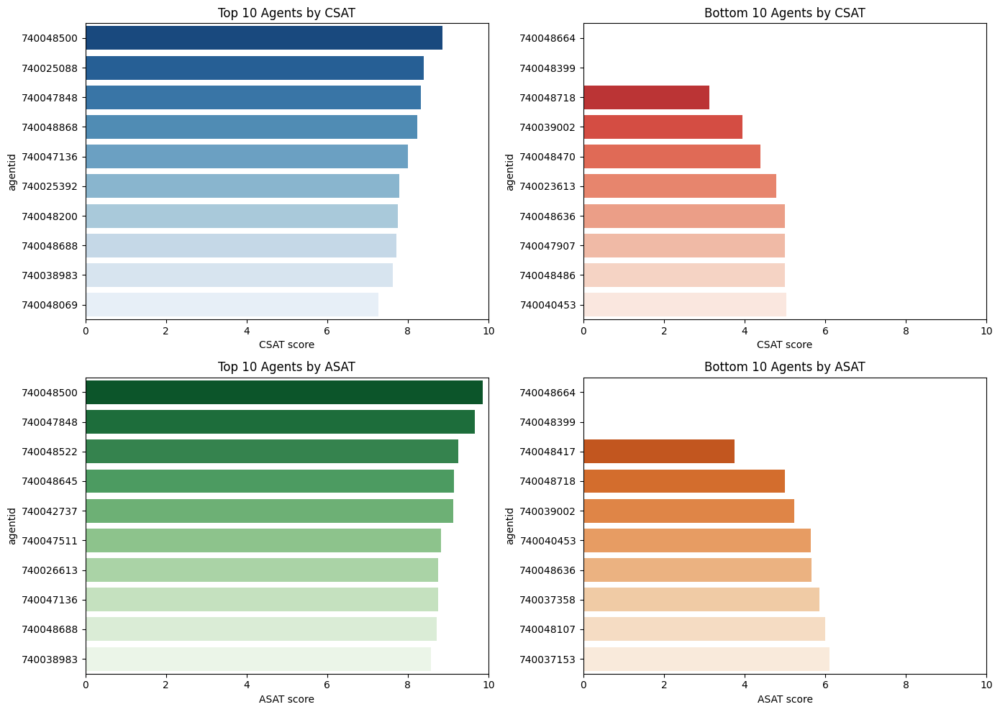

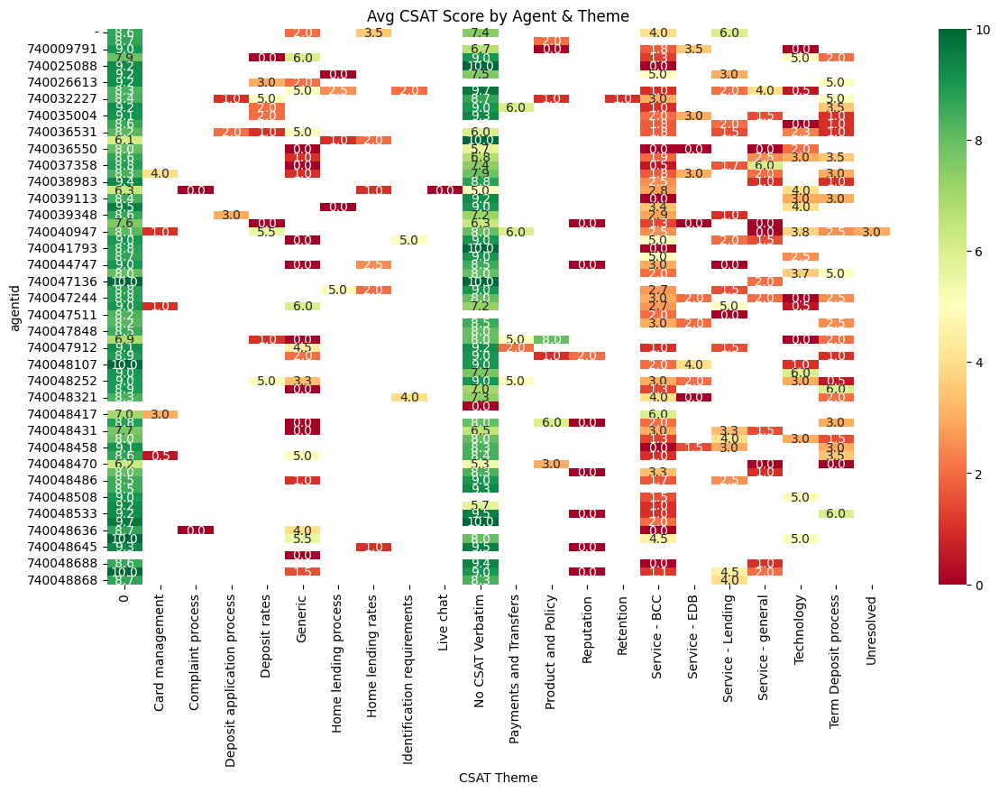

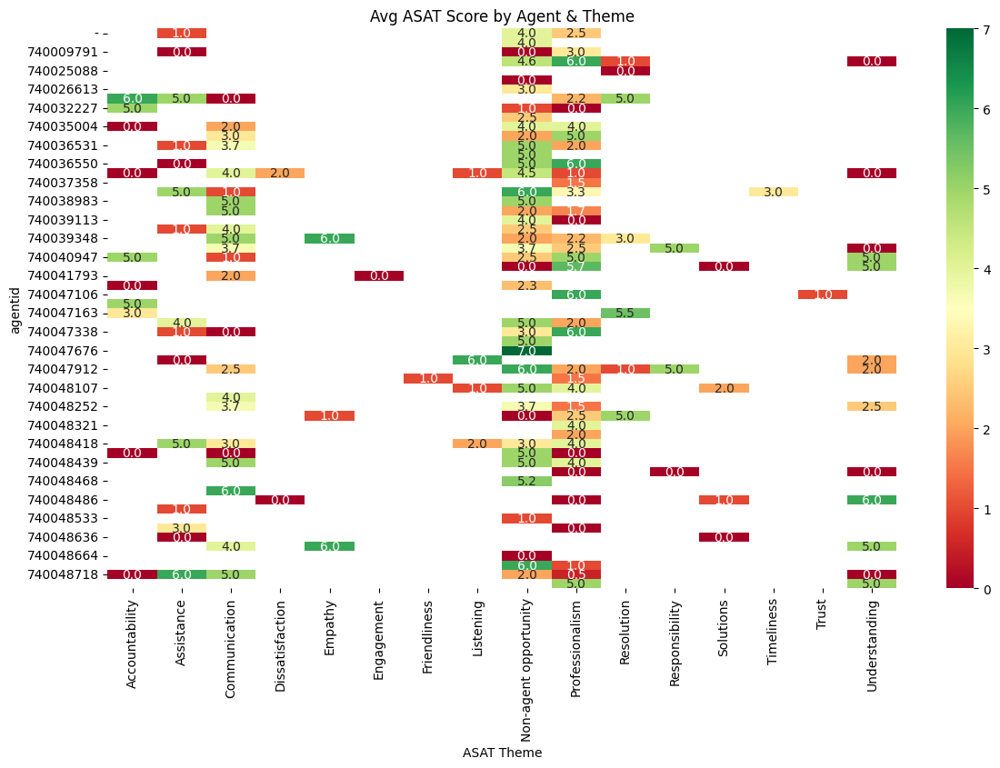

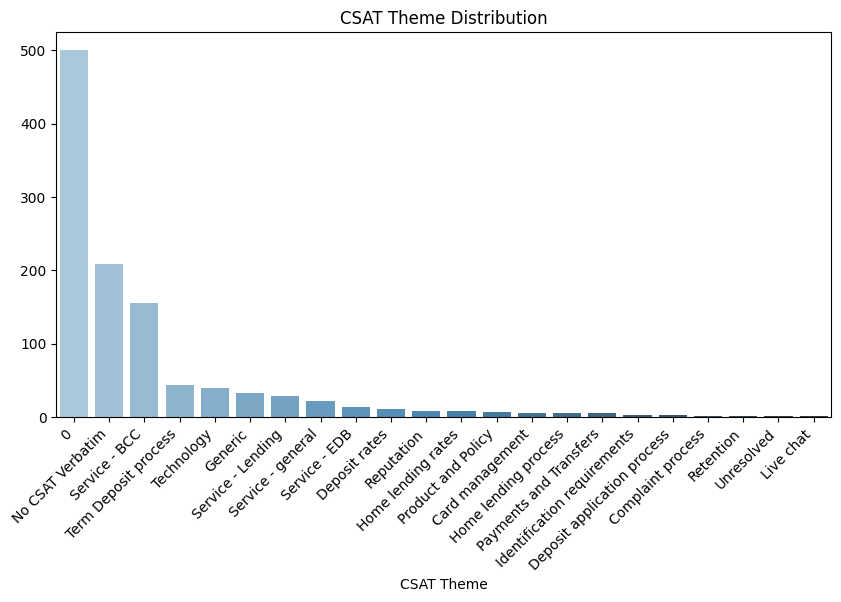

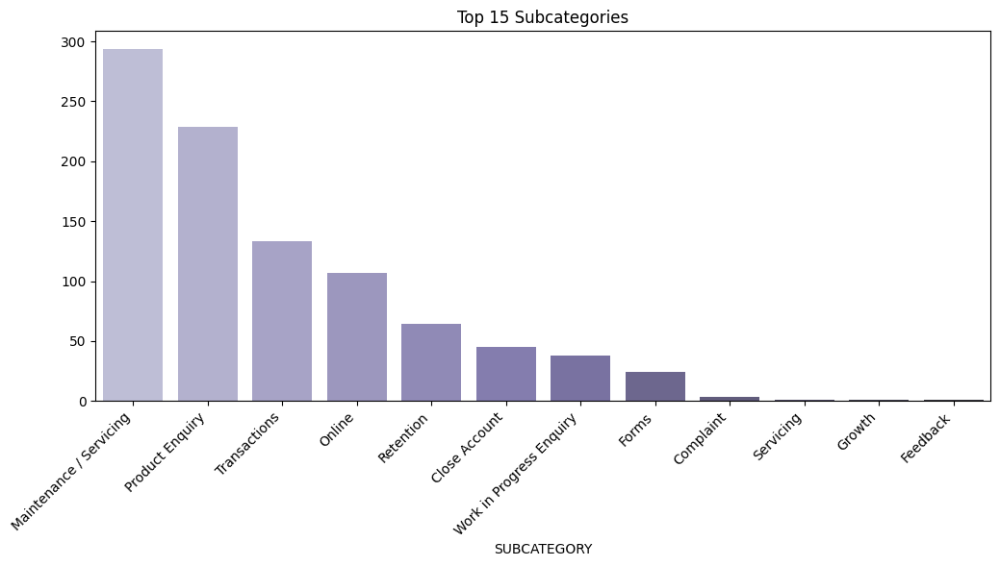


📌 Agent Dashboard (first 15 rows):

      agentid  CSAT score  ASAT score  Volume
0           -    6.705882    7.823529      17
1           0    7.000000    7.750000       4
2   740009791    5.708333    7.333333      24
3   740023613    4.793103    6.862069      29
4   740025088    8.400000    8.500000      10
5   740025392    7.789474    8.421053      19
6   740026613    7.000000    8.750000       8
7   740031261    5.937500    7.156250      32
8   740032227    6.000000    7.400000      20
9   740033484    6.846154    8.307692      13
10  740035004    7.181818    7.590909      22
11  740035134    6.190476    8.047619      21
12  740036531    5.694444    7.222222      36
13  740036536    6.000000    7.714286      14
14  740036550    5.777778    7.814815      27


In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# --- Step 0: Rename columns consistently (if needed) ---
rename_map = {
    'How would you rate the service you received from the consultant handling your enquiry?': 'ASAT score',
    'What are your most important reasons for giving us that score?': 'csat_feedback',
    'ID': 'agentid'
}
df = df.rename(columns={k:v for k,v in rename_map.items() if k in df.columns})

# Ensure numeric types
for col in ["CSAT score","ASAT score"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

# ==========================================================
# 1. Top 10 & Bottom 10 Agents by CSAT & ASAT
# ==========================================================
agent_scores = df.groupby("agentid")[["CSAT score","ASAT score"]].mean().reset_index()

# --- Top/Bottom CSAT ---
top_csat = agent_scores.sort_values(by="CSAT score", ascending=False).head(10)
bottom_csat = agent_scores.sort_values(by="CSAT score", ascending=True).head(10)

# --- Top/Bottom ASAT ---
top_asat = agent_scores.sort_values(by="ASAT score", ascending=False).head(10)
bottom_asat = agent_scores.sort_values(by="ASAT score", ascending=True).head(10)

print("\n📌 Top 10 Agents by Avg CSAT:\n", top_csat)
print("\n📌 Bottom 10 Agents by Avg CSAT:\n", bottom_csat)
print("\n📌 Top 10 Agents by Avg ASAT:\n", top_asat)
print("\n📌 Bottom 10 Agents by Avg ASAT:\n", bottom_asat)

# --- Charts ---
fig, axs = plt.subplots(2,2, figsize=(14,10))
sns.barplot(x="CSAT score", y="agentid", data=top_csat, ax=axs[0,0], palette="Blues_r")
axs[0,0].set_title("Top 10 Agents by CSAT")
axs[0,0].set_xlim(0,10)

sns.barplot(x="CSAT score", y="agentid", data=bottom_csat, ax=axs[0,1], palette="Reds_r")
axs[0,1].set_title("Bottom 10 Agents by CSAT")
axs[0,1].set_xlim(0,10)

sns.barplot(x="ASAT score", y="agentid", data=top_asat, ax=axs[1,0], palette="Greens_r")
axs[1,0].set_title("Top 10 Agents by ASAT")
axs[1,0].set_xlim(0,10)

sns.barplot(x="ASAT score", y="agentid", data=bottom_asat, ax=axs[1,1], palette="Oranges_r")
axs[1,1].set_title("Bottom 10 Agents by ASAT")
axs[1,1].set_xlim(0,10)

plt.tight_layout()
plt.show()

# ==========================================================
# 2. Heatmap: Avg CSAT/ASAT by Agent & Theme
# ==========================================================
if "CSAT Theme" in df.columns:
    pivot_csat = df.pivot_table(values="CSAT score", index="agentid", columns="CSAT Theme", aggfunc="mean")
    plt.figure(figsize=(14,8))
    sns.heatmap(pivot_csat, annot=True, cmap="RdYlGn", fmt=".1f")
    plt.title("Avg CSAT Score by Agent & Theme")
    plt.show()

if "ASAT Theme" in df.columns:
    pivot_asat = df.pivot_table(values="ASAT score", index="agentid", columns="ASAT Theme", aggfunc="mean")
    plt.figure(figsize=(14,8))
    sns.heatmap(pivot_asat, annot=True, cmap="RdYlGn", fmt=".1f")
    plt.title("Avg ASAT Score by Agent & Theme")
    plt.show()

# ==========================================================
# 3. Theme & Subcategory Distribution
# ==========================================================
if "CSAT Theme" in df.columns:
    csat_counts = df['CSAT Theme'].value_counts()
    plt.figure(figsize=(10,5))
    sns.barplot(x=csat_counts.index, y=csat_counts.values, palette="Blues_d")
    plt.title("CSAT Theme Distribution")
    plt.xticks(rotation=45, ha="right")
    plt.show()

if "SUBCATEGORY" in df.columns:
    subcat_counts = df['SUBCATEGORY'].value_counts().head(15)
    plt.figure(figsize=(12,5))
    sns.barplot(x=subcat_counts.index, y=subcat_counts.values, palette="Purples_d")
    plt.title("Top 15 Subcategories")
    plt.xticks(rotation=45, ha="right")
    plt.show()

# ==========================================================
# 4. Treemap: CSAT Theme → Subcategory
# ==========================================================
if "CSAT Theme" in df.columns and "SUBCATEGORY" in df.columns:
    theme_subcat = df.groupby(['CSAT Theme','SUBCATEGORY']).size().reset_index(name='count')
    fig = px.treemap(theme_subcat, path=['CSAT Theme','SUBCATEGORY'], values='count',
                     color='count', color_continuous_scale='Blues',
                     title="CSAT Themes → Subcategories")
    fig.show()

# ==========================================================
# 5. Weekly Trend of CSAT & ASAT
# ==========================================================
if 'completed date2' in df.columns:
    df['completed date2'] = pd.to_datetime(df['completed date2'], errors='coerce')
    df['Week'] = df['completed date2'].dt.to_period('W').apply(lambda r: r.start_time)

    weekly_csat = df.groupby(['Week','CSAT Theme']).size().reset_index(name='count')
    weekly_asat = df.groupby(['Week','ASAT Theme']).size().reset_index(name='count')

    plt.figure(figsize=(12,6))
    sns.lineplot(data=weekly_csat, x='Week', y='count', hue='CSAT Theme', marker="o")
    plt.title("Weekly Trend of CSAT Themes")
    plt.xticks(rotation=45)
    plt.show()

    plt.figure(figsize=(12,6))
    sns.lineplot(data=weekly_asat, x='Week', y='count', hue='ASAT Theme', marker="o")
    plt.title("Weekly Trend of ASAT Themes")
    plt.xticks(rotation=45)
    plt.show()

# ==========================================================
# 6. Consolidated Agent Dashboard Table
# ==========================================================
agent_volume = df.groupby("agentid").size().reset_index(name="Volume")
agent_dashboard = pd.merge(agent_scores, agent_volume, on="agentid")

print("\n📌 Agent Dashboard (first 15 rows):\n")
print(agent_dashboard.head(15))


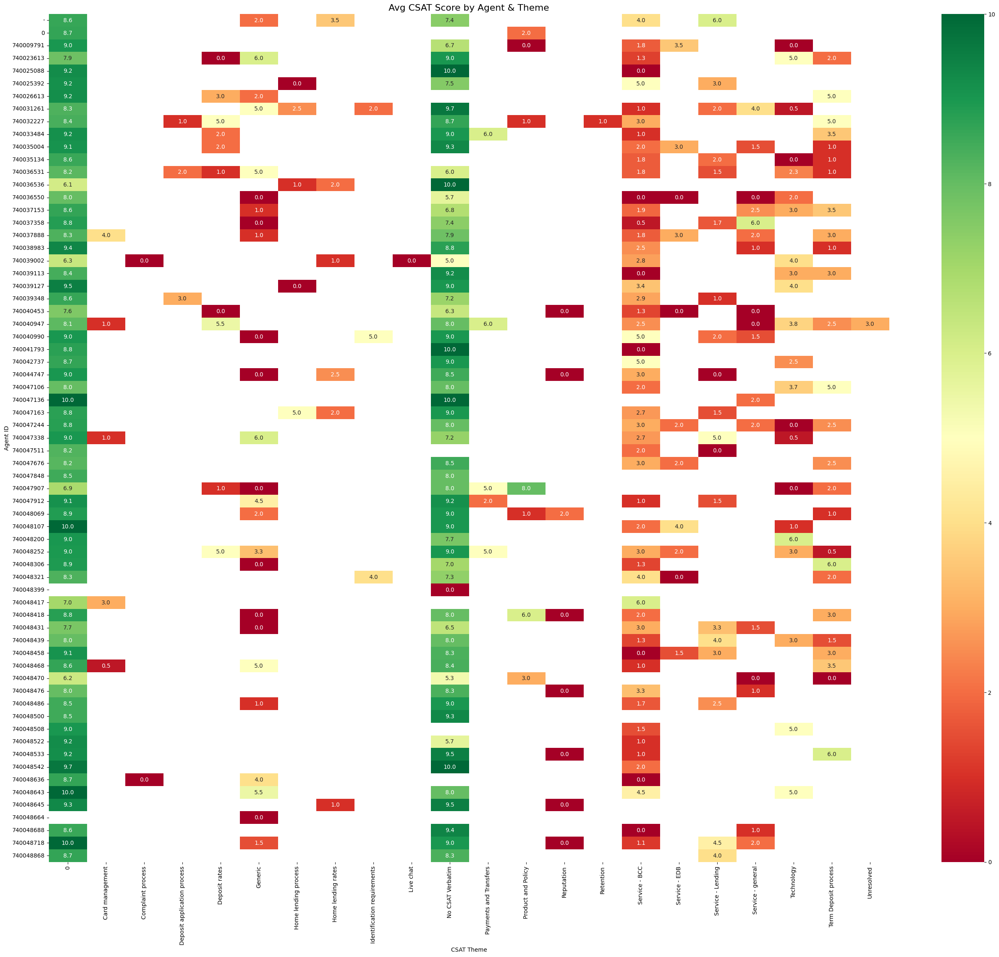

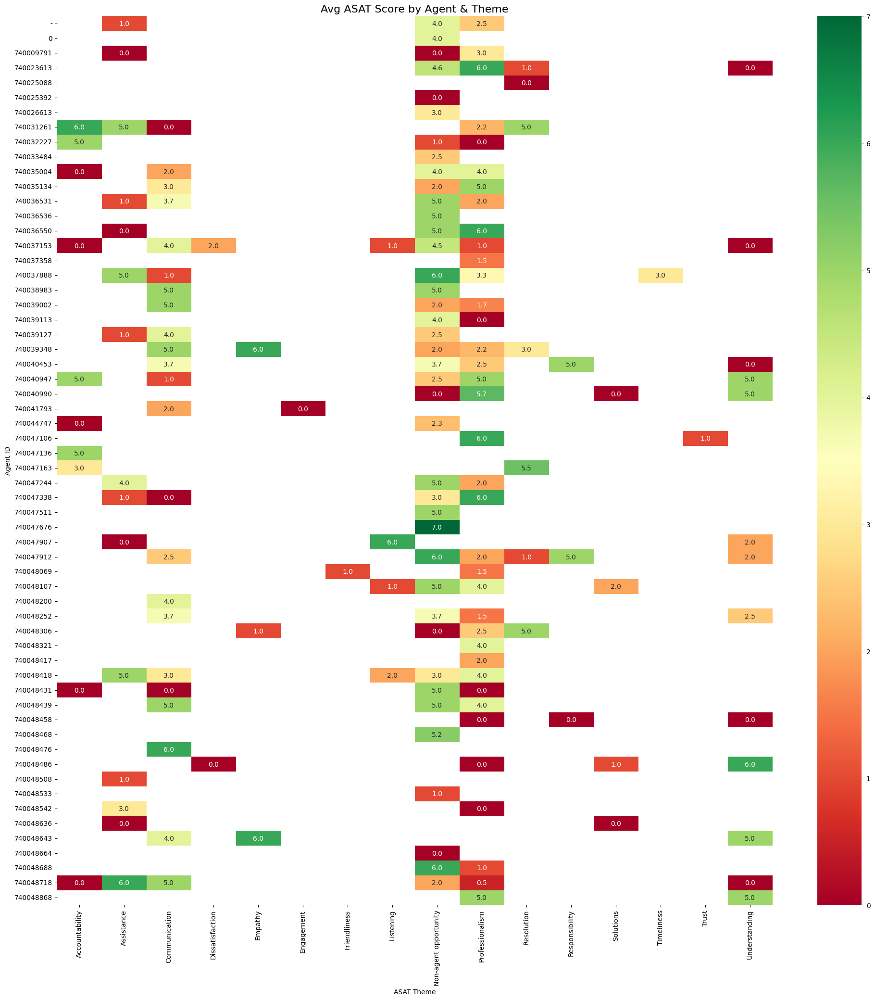

In [39]:
# --- Heatmap: Avg CSAT by Agent & Theme ---
if "CSAT Theme" in df.columns:
    pivot_csat = df.pivot_table(values="CSAT score", index="agentid", columns="CSAT Theme", aggfunc="mean")

    n_agents, n_themes = pivot_csat.shape
    plt.figure(figsize=(max(12, n_themes*1.5), max(10, n_agents*0.4)))  # dynamic size

    sns.heatmap(pivot_csat, annot=True, cmap="RdYlGn", fmt=".1f")
    plt.title("Avg CSAT Score by Agent & Theme", fontsize=16)
    plt.ylabel("Agent ID")
    plt.xlabel("CSAT Theme")
    plt.show()

# --- Heatmap: Avg ASAT by Agent & Theme ---
if "ASAT Theme" in df.columns:
    pivot_asat = df.pivot_table(values="ASAT score", index="agentid", columns="ASAT Theme", aggfunc="mean")

    n_agents, n_themes = pivot_asat.shape
    plt.figure(figsize=(max(12, n_themes*1.5), max(10, n_agents*0.4)))  # dynamic size

    sns.heatmap(pivot_asat, annot=True, cmap="RdYlGn", fmt=".1f")
    plt.title("Avg ASAT Score by Agent & Theme", fontsize=16)
    plt.ylabel("Agent ID")
    plt.xlabel("ASAT Theme")
    plt.show()


In [40]:
import plotly.express as px

# --- Treemap: CSAT Theme → Subcategory ---
if "CSAT Theme" in df.columns and "SUBCATEGORY" in df.columns:
    theme_subcat = df.groupby(['CSAT Theme','SUBCATEGORY']).size().reset_index(name='count')

    fig = px.treemap(
        theme_subcat,
        path=['CSAT Theme','SUBCATEGORY'],
        values='count',
        color='count',
        color_continuous_scale='Blues',
        title="CSAT Themes → Subcategories with Counts"
    )

    # Add counts inside the boxes
    fig.update_traces(textinfo="label+value")

    fig.show()


In [42]:
import plotly.express as px

if "CSAT Theme" in df.columns and "SUBCATEGORY" in df.columns and "CSAT score" in df.columns:
    # --- Ensure CSAT score is numeric ---
    df['CSAT score'] = pd.to_numeric(df['CSAT score'], errors="coerce")

    # --- Drop rows with missing CSAT scores ---
    df_csat = df.dropna(subset=["CSAT score"])

    # --- Aggregate count + avg CSAT ---
    theme_subcat = df_csat.groupby(['CSAT Theme','SUBCATEGORY']).agg(
        count=('CSAT score','size'),
        avg_csat=('CSAT score','mean')
    ).reset_index()

    # --- Build Treemap ---
    fig = px.treemap(
        theme_subcat,
        path=['CSAT Theme','SUBCATEGORY'],
        values='count',                   # box size = count
        color='avg_csat',                 # color = average CSAT
        color_continuous_scale='RdYlGn',  # red = low, green = high
        title="CSAT Themes → Subcategories (Count & Avg Score)"
    )

    # Show label + count + avg score inside
    fig.update_traces(
        texttemplate="%{label}<br>Count: %{value}<br>Avg CSAT: %{color:.1f}",
        textinfo="text"
    )

    # Bigger chart
    fig.update_layout(
        width=1400,
        height=900,
        title_font_size=22
    )

    fig.show()


In [43]:
import plotly.express as px

# --- Ensure CSAT score is numeric ---
df['CSAT score'] = pd.to_numeric(df['CSAT score'], errors="coerce")

# --- Keep only rows with valid CSAT score ---
df_csat = df.dropna(subset=["CSAT score"])

# --- Aggregate by Theme & Subcategory ---
theme_subcat = df_csat.groupby(['CSAT Theme','SUBCATEGORY']).agg(
    count=('CSAT score','size'),
    avg_csat=('CSAT score','mean')
).reset_index()

# --- Treemap ---
fig = px.treemap(
    theme_subcat,
    path=['CSAT Theme','SUBCATEGORY'],
    values='count',                     # size = count
    color='avg_csat',                   # color = avg CSAT
    color_continuous_scale='RdYlGn',    # red = low, green = high
    title="CSAT Themes → Subcategories (Count & Avg Score)"
)

# Show label + count + avg score
fig.update_traces(
    texttemplate="%{label}<br>Count: %{value}<br>Avg CSAT: %{color:.1f}",
    textinfo="text"
)

# Make chart larger
fig.update_layout(
    width=1800,    # wider
    height=1100,   # taller
    title_font_size=26
)

fig.show()


In [45]:
import plotly.express as px

# --- Ensure CSAT score is numeric ---
df['CSAT score'] = pd.to_numeric(df['CSAT score'], errors="coerce")

# --- Keep only rows with valid CSAT score ---
df_csat = df.dropna(subset=["CSAT score"])

# --- Aggregate by Theme & Subcategory ---
theme_subcat = df_csat.groupby(['CSAT Theme','SUBCATEGORY']).agg(
    count=('CSAT score','size'),
    avg_csat=('CSAT score','mean')
).reset_index()

# --- Treemap ---
fig = px.treemap(
    theme_subcat,
    path=['CSAT Theme','SUBCATEGORY'],
    values='count',
    color='avg_csat',
    color_continuous_scale='RdYlGn',
    title="CSAT Themes → Subcategories (Count & Avg Score)"
)

# ✅ Format average CSAT with 1 decimal
fig.update_traces(
    texttemplate="%{label}<br>Count: %{value}<br>Avg CSAT: %{color:.1f}",
    textinfo="text"
)

# Bigger chart
fig.update_layout(
    width=1800,
    height=1100,
    title_font_size=26
)

fig.show()


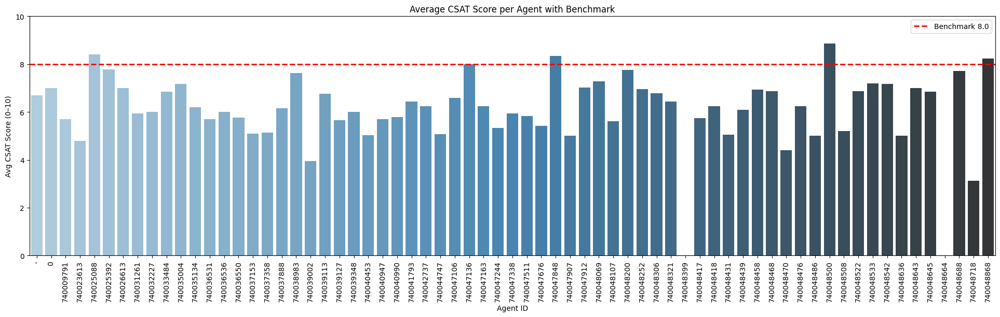

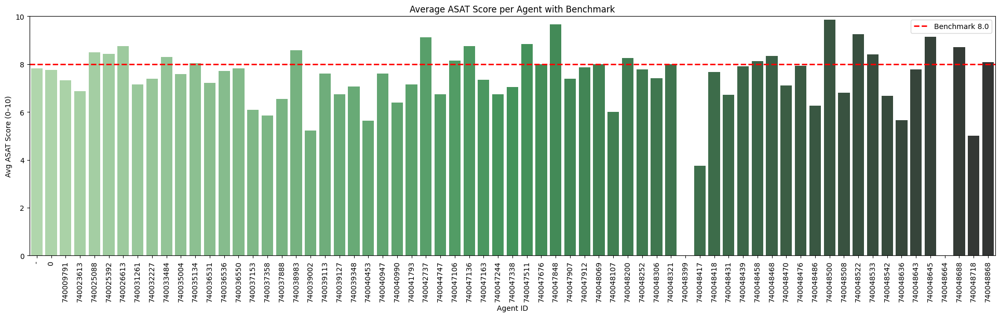

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Compute agent averages ---
agent_scores = df.groupby("agentid")[["CSAT score","ASAT score"]].mean().reset_index()

# --- Set Benchmark Thresholds ---
csat_threshold = 8.0
asat_threshold = 8.0

# --- Plot CSAT ---
plt.figure(figsize=(24,6))
sns.barplot(x="agentid", y="CSAT score", data=agent_scores, palette="Blues_d")
plt.axhline(y=csat_threshold, color="red", linestyle="--", linewidth=2, label=f"Benchmark {csat_threshold}")
plt.title("Average CSAT Score per Agent with Benchmark")
plt.ylabel("Avg CSAT Score (0–10)")
plt.xlabel("Agent ID")
plt.xticks(rotation=90)
plt.legend()
plt.ylim(0,10)
plt.show()

# --- Plot ASAT ---
plt.figure(figsize=(24,6))
sns.barplot(x="agentid", y="ASAT score", data=agent_scores, palette="Greens_d")
plt.axhline(y=asat_threshold, color="red", linestyle="--", linewidth=2, label=f"Benchmark {asat_threshold}")
plt.title("Average ASAT Score per Agent with Benchmark")
plt.ylabel("Avg ASAT Score (0–10)")
plt.xlabel("Agent ID")
plt.xticks(rotation=90)
plt.legend()
plt.ylim(0,10)
plt.show()


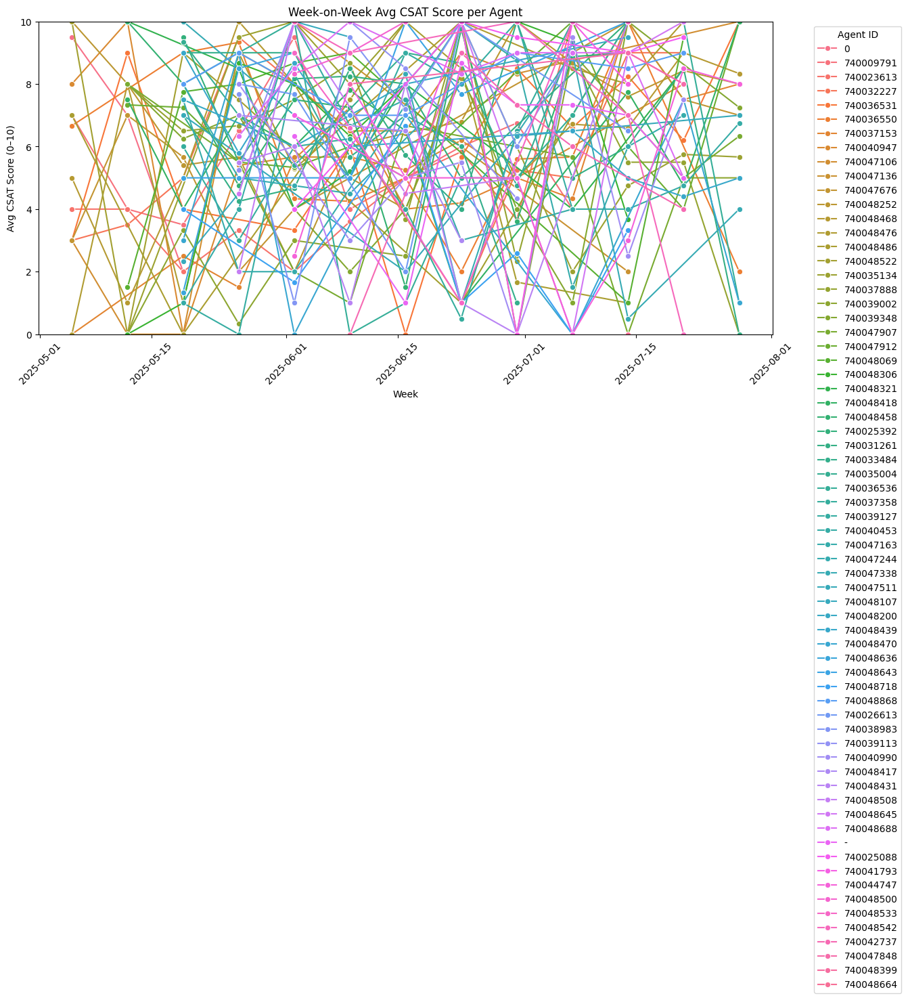

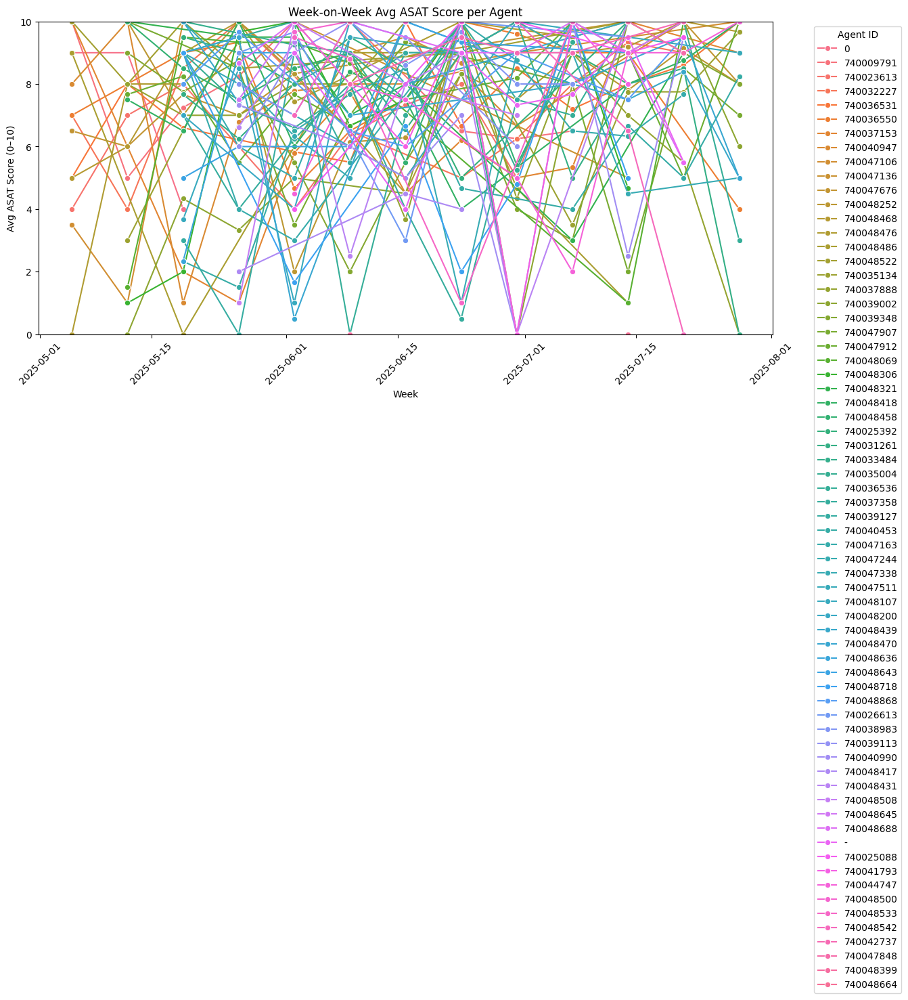

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Ensure correct datetime column ---
df['Completed Date 2'] = pd.to_datetime(df['Completed Date 2'], errors="coerce")

# --- Create Week column ---
df['Week'] = df['Completed Date 2'].dt.to_period('W').apply(lambda r: r.start_time)

# --- Aggregate Avg CSAT & ASAT per Agent per Week ---
weekly_agent_scores = df.groupby(['Week','agentid']).agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean')
).reset_index()

# --- Plot Weekly CSAT per Agent ---
plt.figure(figsize=(14,6))
sns.lineplot(data=weekly_agent_scores, x='Week', y='avg_csat', hue='agentid', marker="o")
plt.title("Week-on-Week Avg CSAT Score per Agent")
plt.ylabel("Avg CSAT Score (0–10)")
plt.xlabel("Week")
plt.xticks(rotation=45)
plt.ylim(0,10)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Agent ID")
plt.show()

# --- Plot Weekly ASAT per Agent ---
plt.figure(figsize=(14,6))
sns.lineplot(data=weekly_agent_scores, x='Week', y='avg_asat', hue='agentid', marker="o")
plt.title("Week-on-Week Avg ASAT Score per Agent")
plt.ylabel("Avg ASAT Score (0–10)")
plt.xlabel("Week")
plt.xticks(rotation=45)
plt.ylim(0,10)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Agent ID")
plt.show()


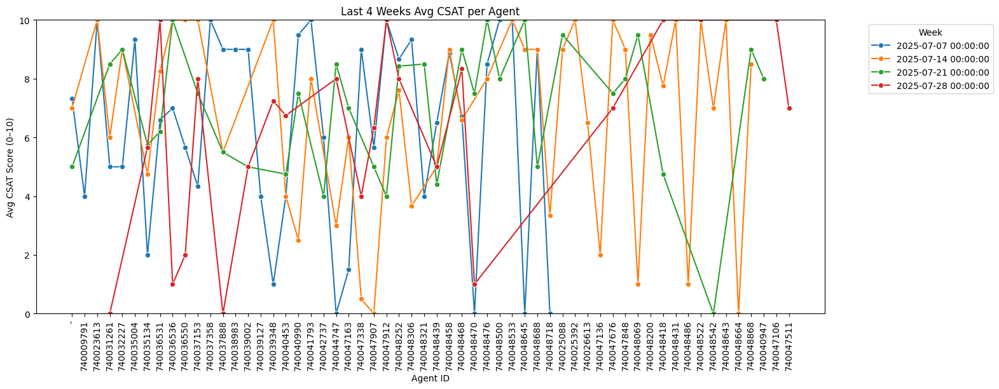

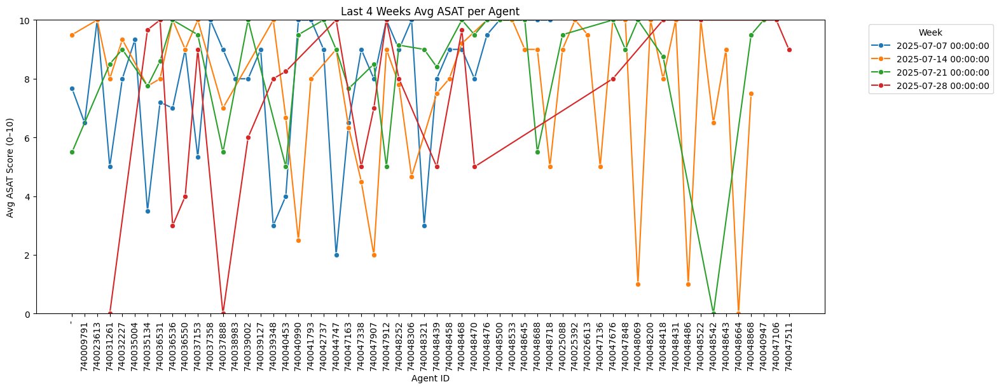

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Ensure Completed Date 2 is datetime ---
df['Completed Date 2'] = pd.to_datetime(df['Completed Date 2'], errors="coerce")

# --- Create Week column ---
df['Week'] = df['Completed Date 2'].dt.to_period('W').apply(lambda r: r.start_time)

# --- Aggregate Avg CSAT & ASAT per Agent per Week ---
weekly_agent_scores = df.groupby(['Week','agentid']).agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean')
).reset_index()

# --- Keep only last 4 weeks ---
last_4_weeks = sorted(weekly_agent_scores['Week'].unique())[-4:]
weekly_agent_scores = weekly_agent_scores[weekly_agent_scores['Week'].isin(last_4_weeks)]

# --- Line Chart: CSAT ---
plt.figure(figsize=(16,6))
sns.lineplot(data=weekly_agent_scores, x='agentid', y='avg_csat', hue='Week', marker="o", palette="tab10")
plt.title("Last 4 Weeks Avg CSAT per Agent")
plt.ylabel("Avg CSAT Score (0–10)")
plt.xlabel("Agent ID")
plt.xticks(rotation=90)
plt.ylim(0,10)
plt.legend(title="Week", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# --- Line Chart: ASAT ---
plt.figure(figsize=(16,6))
sns.lineplot(data=weekly_agent_scores, x='agentid', y='avg_asat', hue='Week', marker="o", palette="tab10")
plt.title("Last 4 Weeks Avg ASAT per Agent")
plt.ylabel("Avg ASAT Score (0–10)")
plt.xlabel("Agent ID")
plt.xticks(rotation=90)
plt.ylim(0,10)
plt.legend(title="Week", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


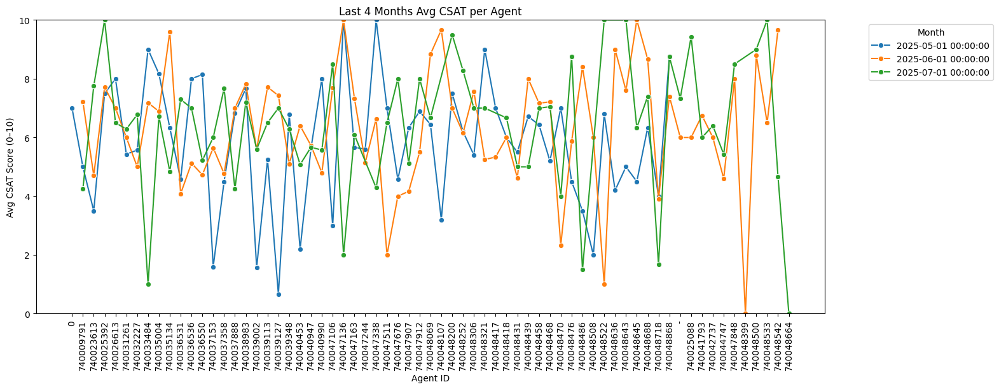

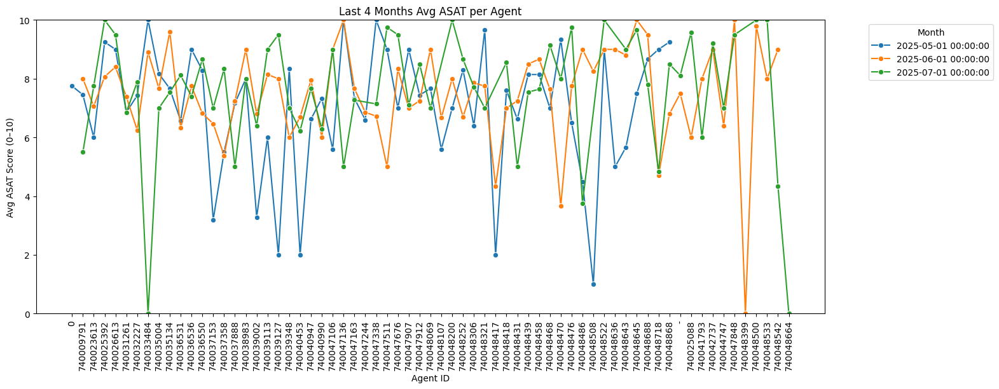

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Ensure Completed Date 2 is datetime ---
df['Completed Date 2'] = pd.to_datetime(df['Completed Date 2'], errors="coerce")

# --- Create Month column ---
df['Month'] = df['Completed Date 2'].dt.to_period('M').apply(lambda r: r.start_time)

# --- Aggregate Avg CSAT & ASAT per Agent per Month ---
monthly_agent_scores = df.groupby(['Month','agentid']).agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean')
).reset_index()

# --- Keep only last 4 months ---
last_4_months = sorted(monthly_agent_scores['Month'].unique())[-4:]
monthly_agent_scores = monthly_agent_scores[monthly_agent_scores['Month'].isin(last_4_months)]

# --- Line Chart: CSAT ---
plt.figure(figsize=(16,6))
sns.lineplot(data=monthly_agent_scores, x='agentid', y='avg_csat', hue='Month', marker="o", palette="tab10")
plt.title("Last 4 Months Avg CSAT per Agent")
plt.ylabel("Avg CSAT Score (0–10)")
plt.xlabel("Agent ID")
plt.xticks(rotation=90)
plt.ylim(0,10)
plt.legend(title="Month", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# --- Line Chart: ASAT ---
plt.figure(figsize=(16,6))
sns.lineplot(data=monthly_agent_scores, x='agentid', y='avg_asat', hue='Month', marker="o", palette="tab10")
plt.title("Last 4 Months Avg ASAT per Agent")
plt.ylabel("Avg ASAT Score (0–10)")
plt.xlabel("Agent ID")
plt.xticks(rotation=90)
plt.ylim(0,10)
plt.legend(title="Month", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


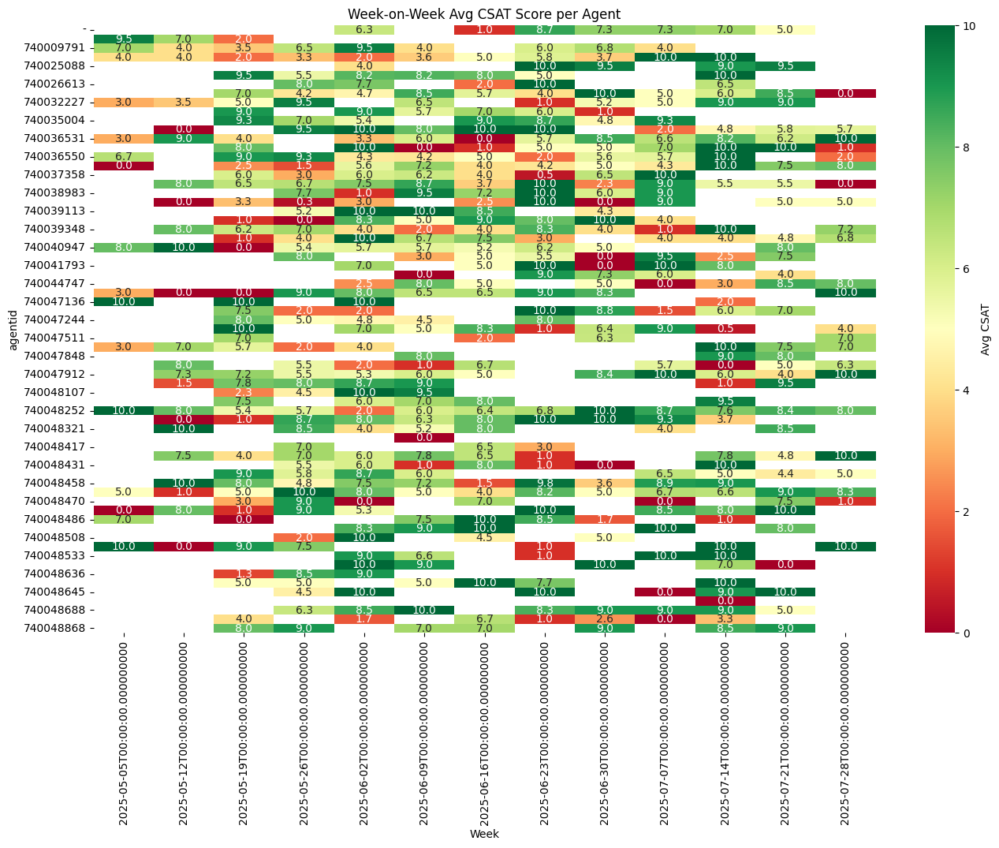

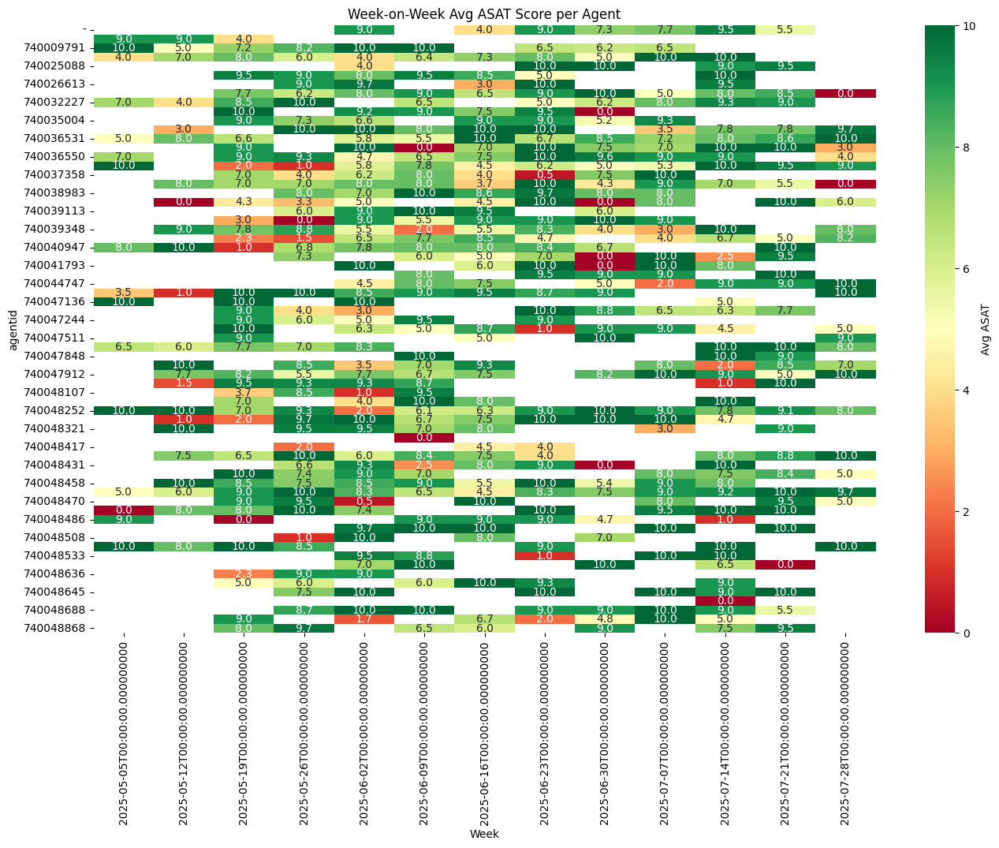

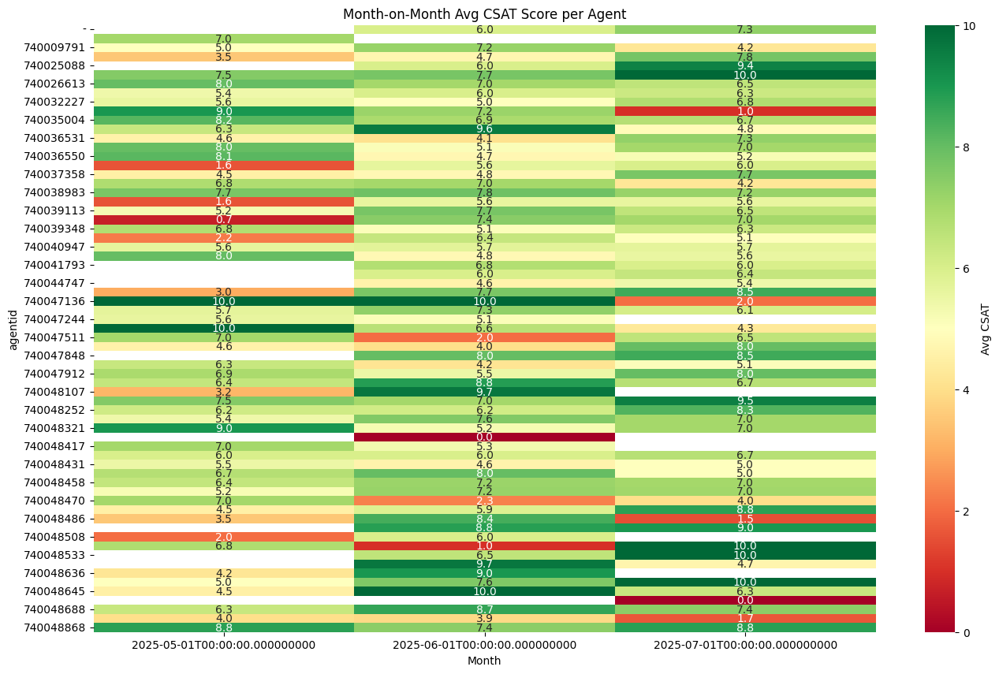

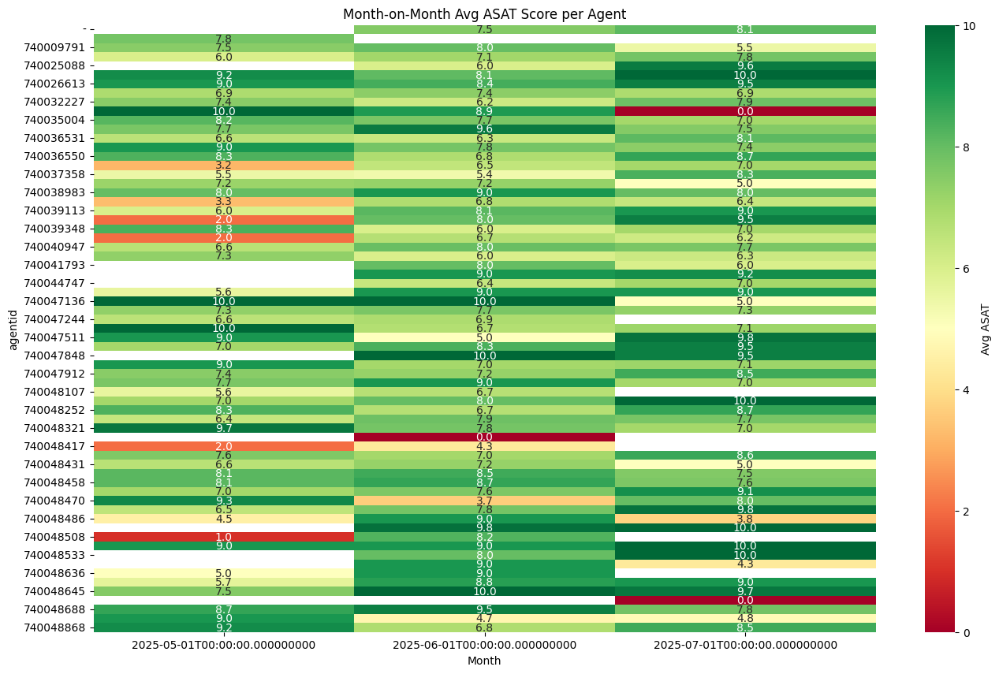

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Ensure Completed Date 2 is datetime ---
df['Completed Date 2'] = pd.to_datetime(df['Completed Date 2'], errors="coerce")

# --- Create Week and Month columns ---
df['Week'] = df['Completed Date 2'].dt.to_period('W').apply(lambda r: r.start_time)
df['Month'] = df['Completed Date 2'].dt.to_period('M').apply(lambda r: r.start_time)

# ======================================================
# 1. Week-on-Week Heatmap (CSAT & ASAT)
# ======================================================
weekly_scores = df.groupby(['Week','agentid']).agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean')
).reset_index()

# Pivot for heatmap
pivot_csat_week = weekly_scores.pivot(index="agentid", columns="Week", values="avg_csat")
pivot_asat_week = weekly_scores.pivot(index="agentid", columns="Week", values="avg_asat")

plt.figure(figsize=(16,10))
sns.heatmap(pivot_csat_week, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label': 'Avg CSAT'})
plt.title("Week-on-Week Avg CSAT Score per Agent")
plt.show()

plt.figure(figsize=(16,10))
sns.heatmap(pivot_asat_week, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label': 'Avg ASAT'})
plt.title("Week-on-Week Avg ASAT Score per Agent")
plt.show()

# ======================================================
# 2. Month-on-Month Heatmap (CSAT & ASAT)
# ======================================================
monthly_scores = df.groupby(['Month','agentid']).agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean')
).reset_index()

pivot_csat_month = monthly_scores.pivot(index="agentid", columns="Month", values="avg_csat")
pivot_asat_month = monthly_scores.pivot(index="agentid", columns="Month", values="avg_asat")

plt.figure(figsize=(16,10))
sns.heatmap(pivot_csat_month, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label': 'Avg CSAT'})
plt.title("Month-on-Month Avg CSAT Score per Agent")
plt.show()

plt.figure(figsize=(16,10))
sns.heatmap(pivot_asat_month, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label': 'Avg ASAT'})
plt.title("Month-on-Month Avg ASAT Score per Agent")
plt.show()


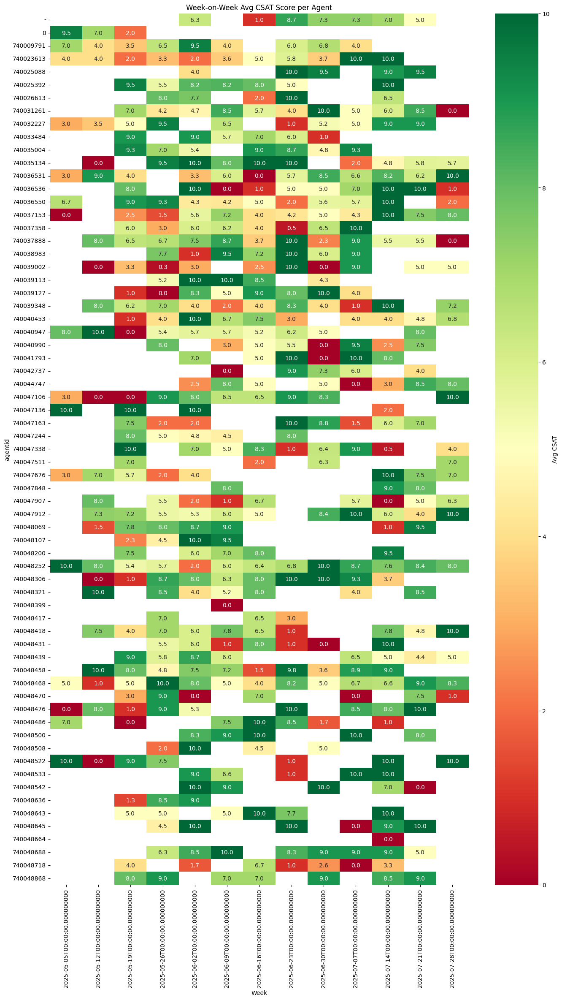

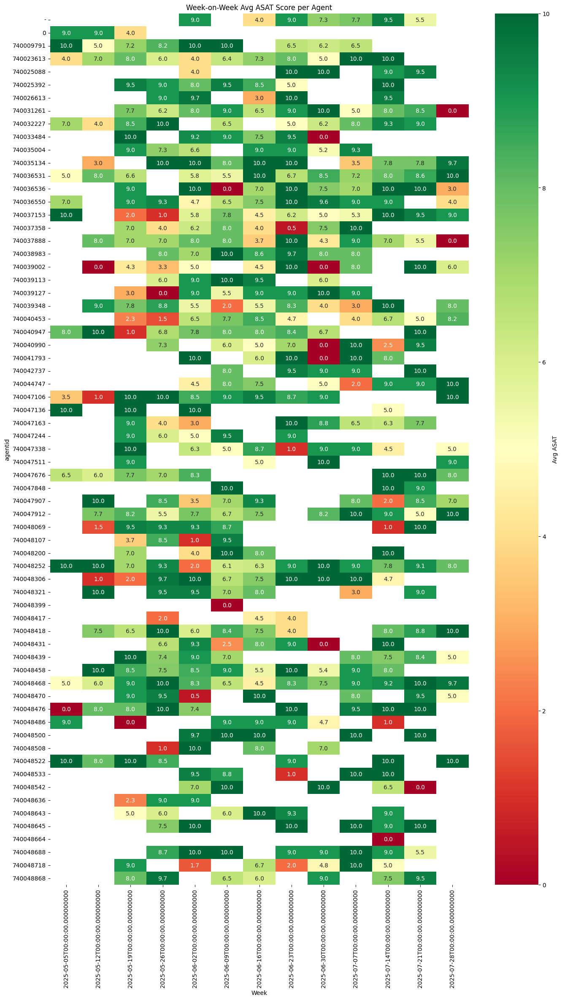

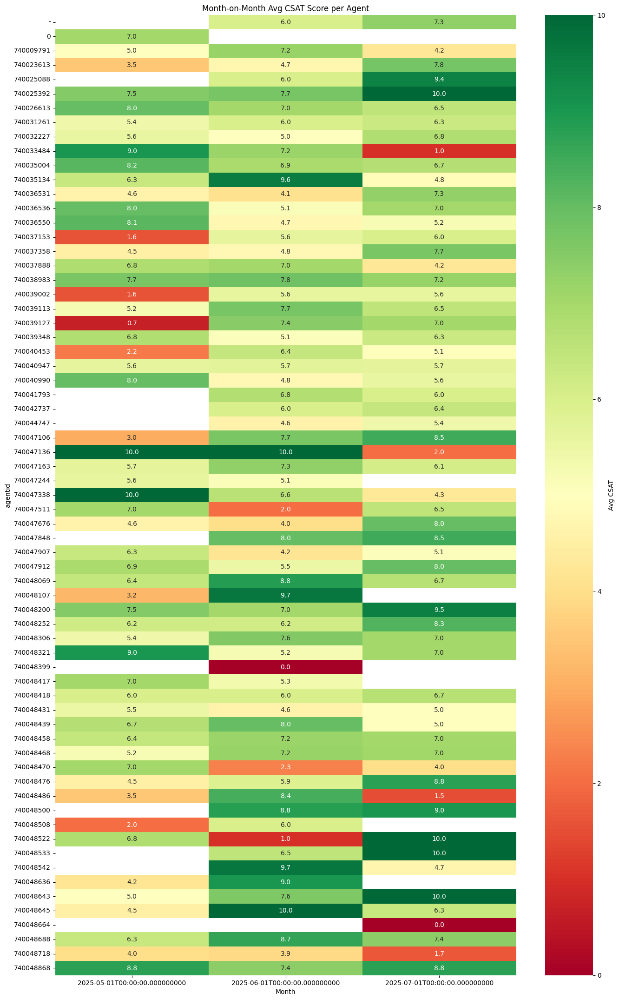

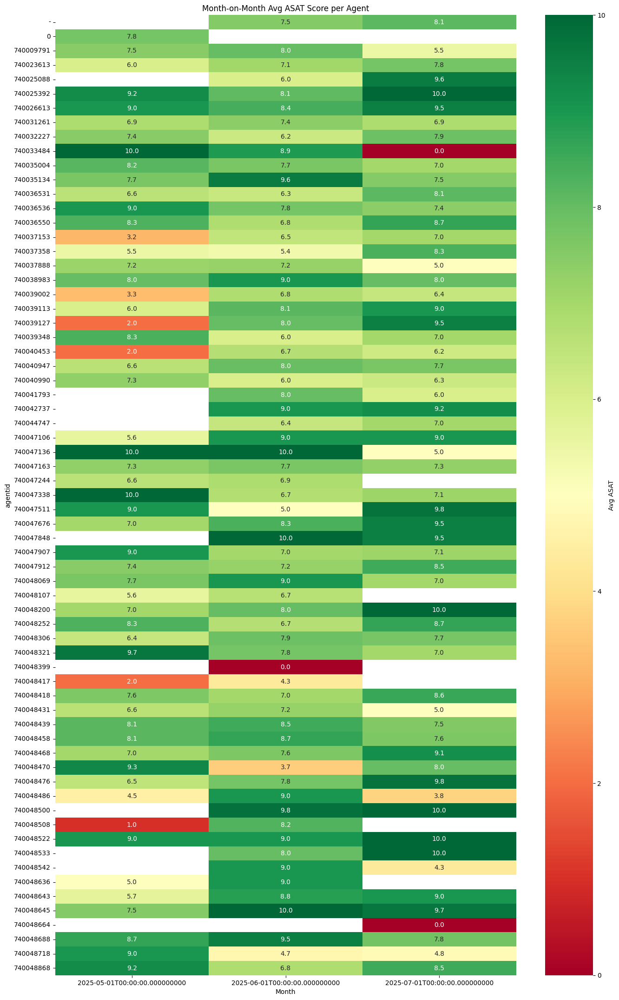

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Week-on-Week Heatmap (CSAT) ---
n_agents = len(pivot_csat_week.index)  # number of agents
plt.figure(figsize=(16, max(10, n_agents * 0.4)))  # increase height per agent row
sns.heatmap(pivot_csat_week, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label': 'Avg CSAT'})
plt.title("Week-on-Week Avg CSAT Score per Agent")
plt.show()

# --- Week-on-Week Heatmap (ASAT) ---
n_agents = len(pivot_asat_week.index)
plt.figure(figsize=(16, max(10, n_agents * 0.4)))
sns.heatmap(pivot_asat_week, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label': 'Avg ASAT'})
plt.title("Week-on-Week Avg ASAT Score per Agent")
plt.show()

# --- Month-on-Month Heatmap (CSAT) ---
n_agents = len(pivot_csat_month.index)
plt.figure(figsize=(16, max(10, n_agents * 0.4)))
sns.heatmap(pivot_csat_month, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label': 'Avg CSAT'})
plt.title("Month-on-Month Avg CSAT Score per Agent")
plt.show()

# --- Month-on-Month Heatmap (ASAT) ---
n_agents = len(pivot_asat_month.index)
plt.figure(figsize=(16, max(10, n_agents * 0.4)))
sns.heatmap(pivot_asat_month, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label': 'Avg ASAT'})
plt.title("Month-on-Month Avg ASAT Score per Agent")
plt.show()


📌 Overall Metrics:
 {'Avg CSAT': np.float64(6.163652802893309), 'Avg ASAT': np.float64(7.420433996383363), 'FCR %': np.float64(67.90235081374321)}


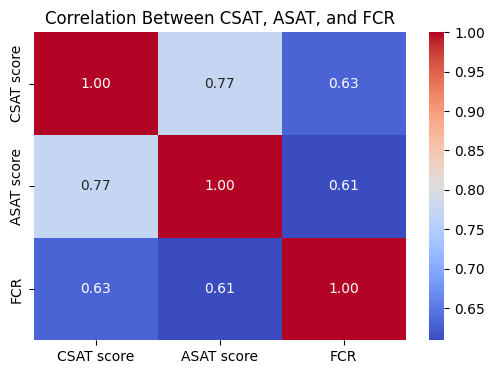


📌 Agent Performance (first 10 rows):
      agentid  avg_csat  avg_asat  fcr_rate
0          -  6.705882  7.823529  0.764706
1          0  7.000000  7.750000  0.500000
2  740009791  5.708333  7.333333  0.875000
3  740023613  4.793103  6.862069  0.551724
4  740025088  8.400000  8.500000  0.700000
5  740025392  7.789474  8.421053  0.789474
6  740026613  7.000000  8.750000  0.875000
7  740031261  5.937500  7.156250  0.625000
8  740032227  6.000000  7.400000  0.700000
9  740033484  6.846154  8.307692  0.692308


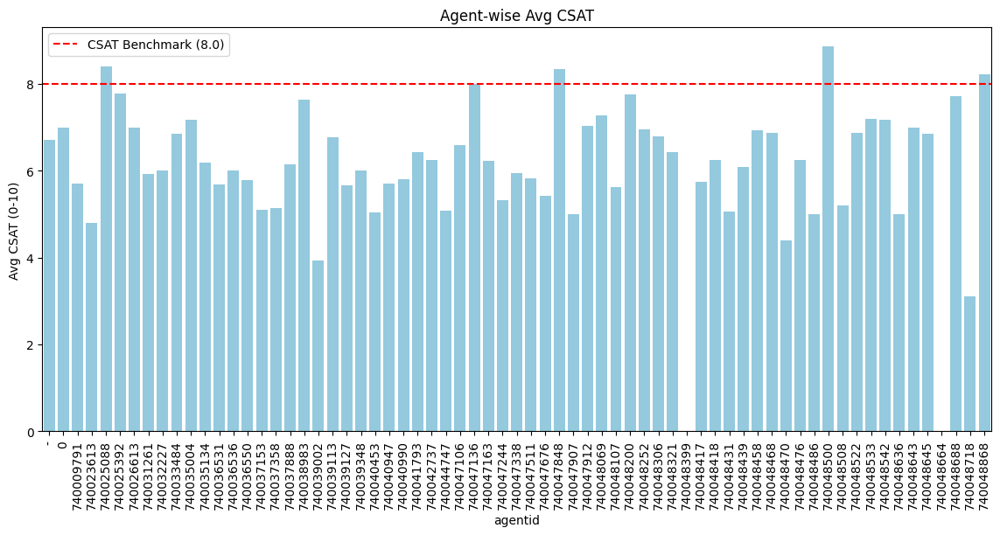

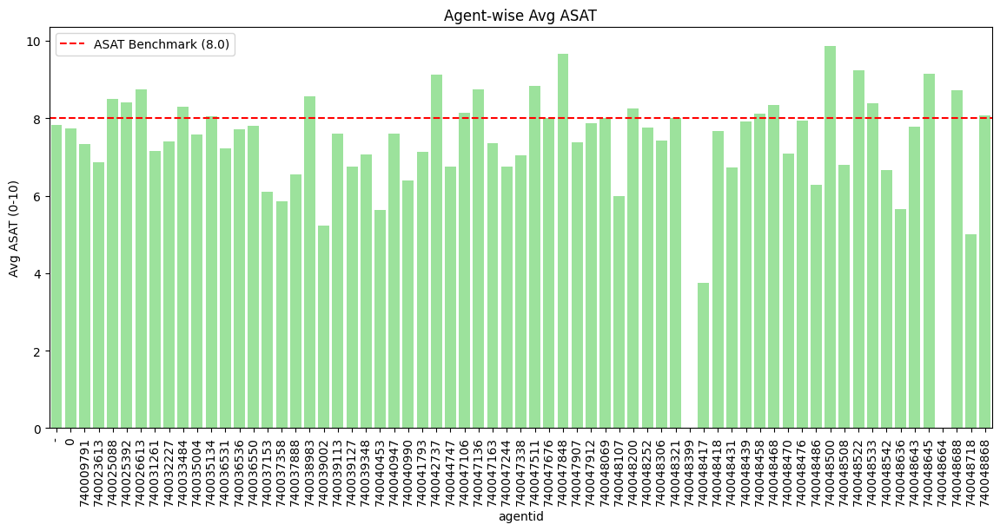

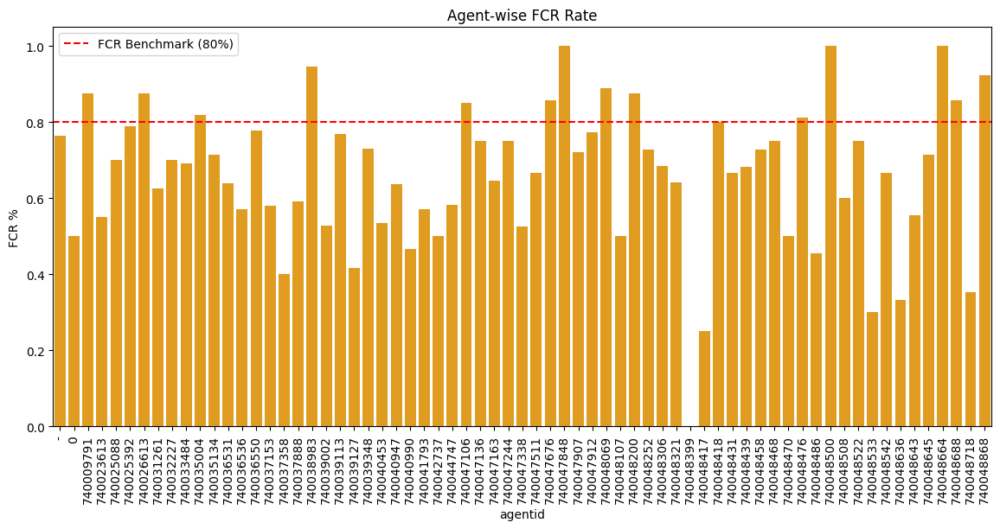

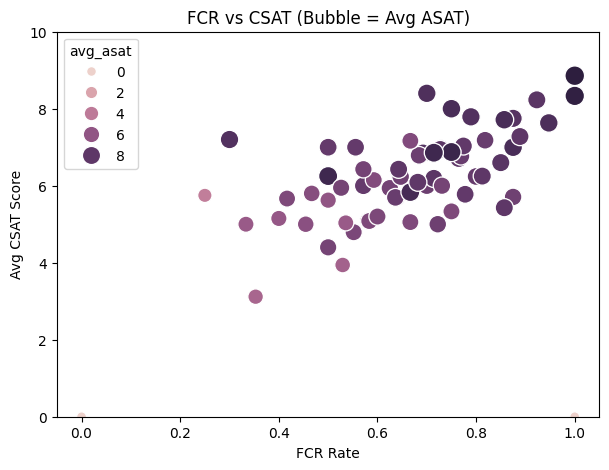

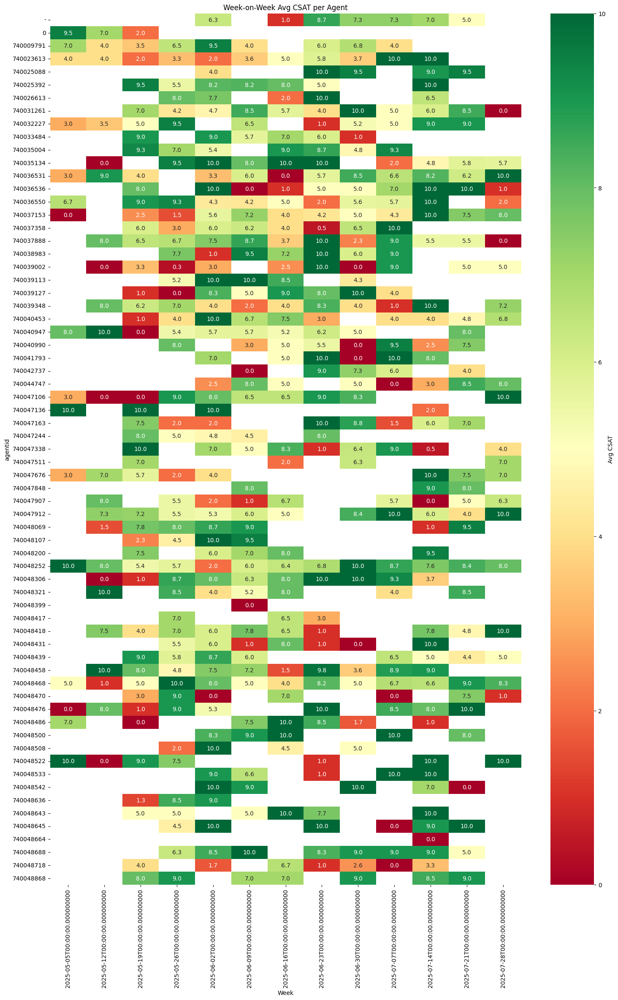

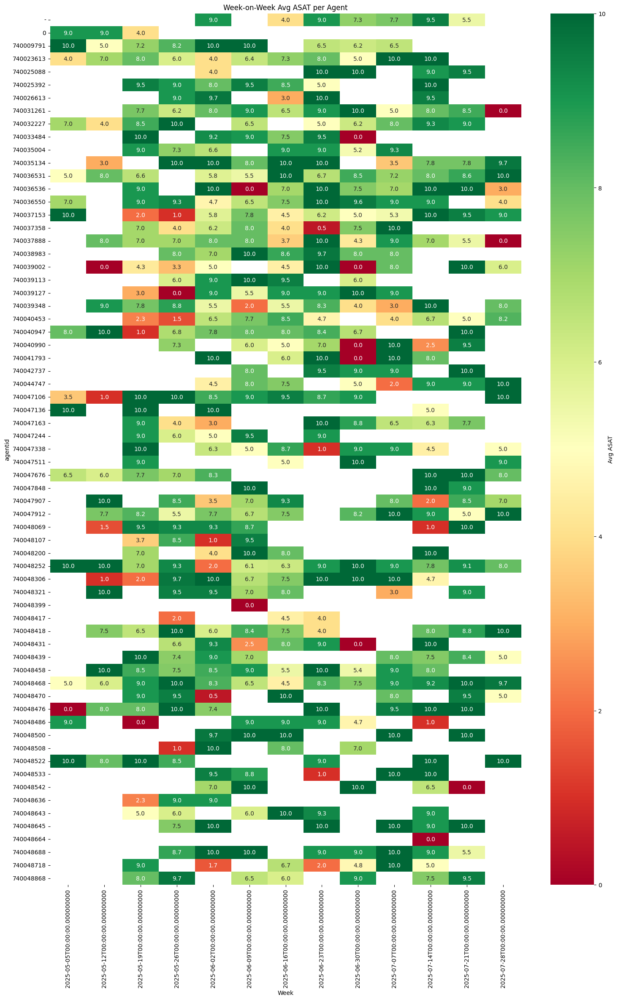

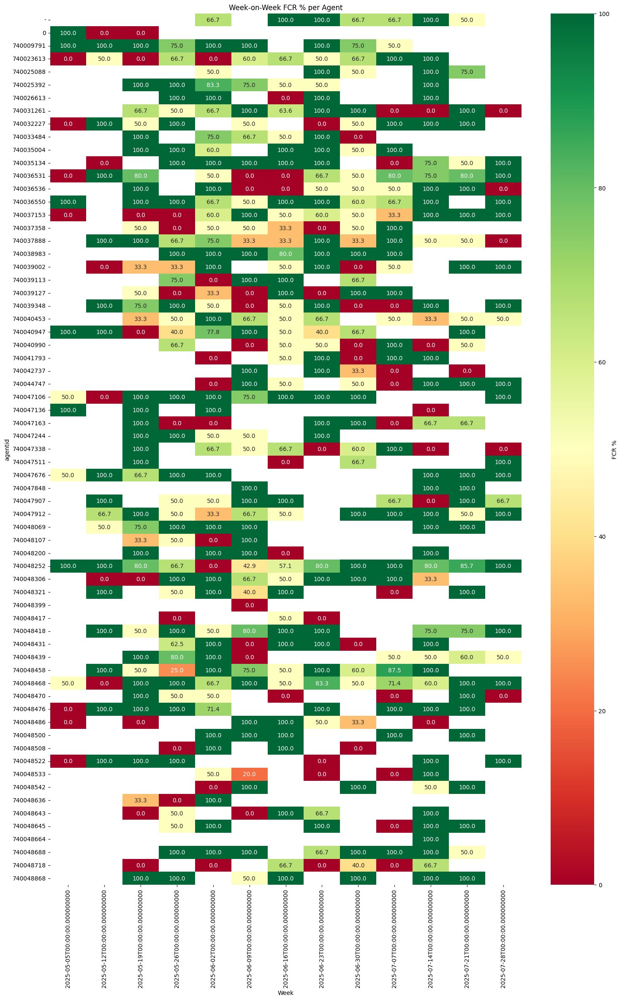


📌 Top 10 Agents (CSAT):
       agentid  avg_csat  avg_asat  fcr_rate
55  740048500  8.857143  9.857143  1.000000
4   740025088  8.400000  8.500000  0.700000
36  740047848  8.333333  9.666667  1.000000
66  740048868  8.230769  8.076923  0.923077
30  740047136  8.000000  8.750000  0.750000
5   740025392  7.789474  8.421053  0.789474
41  740048200  7.750000  8.250000  0.875000
64  740048688  7.714286  8.714286  0.857143
18  740038983  7.631579  8.578947  0.947368
39  740048069  7.277778  8.000000  0.888889

📌 Bottom 10 Agents (CSAT):
       agentid  avg_csat  avg_asat  fcr_rate
63  740048664  0.000000  0.000000  1.000000
45  740048399  0.000000  0.000000  0.000000
65  740048718  3.117647  5.000000  0.352941
19  740039002  3.941176  5.235294  0.529412
52  740048470  4.400000  7.100000  0.500000
3   740023613  4.793103  6.862069  0.551724
60  740048636  5.000000  5.666667  0.333333
37  740047907  5.000000  7.388889  0.722222
54  740048486  5.000000  6.272727  0.454545
23  740040453  5.0357

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Ensure correct types ---
df['Completed Date 2'] = pd.to_datetime(df['Completed Date 2'], errors="coerce")
df['CSAT score'] = pd.to_numeric(df['CSAT score'], errors="coerce")
df['ASAT score'] = pd.to_numeric(df['ASAT score'], errors="coerce")

# Convert FCR to numeric (Yes=1, No=0 if needed)
if df['FCR'].dtype == 'object':
    df['FCR'] = df['FCR'].map({'Yes':1, 'No':0}).fillna(0).astype(float)

# ======================================================
# 1. OVERALL METRICS
# ======================================================
overall = {
    "Avg CSAT": df['CSAT score'].mean(),
    "Avg ASAT": df['ASAT score'].mean(),
    "FCR %": df['FCR'].mean() * 100
}
print("📌 Overall Metrics:\n", overall)

# Correlation Heatmap
plt.figure(figsize=(6,4))
sns.heatmap(df[['CSAT score','ASAT score','FCR']].corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Between CSAT, ASAT, and FCR")
plt.show()

# ======================================================
# 2. AGENT-LEVEL PERFORMANCE
# ======================================================
agent_perf = df.groupby("agentid").agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean'),
    fcr_rate=('FCR','mean')
).reset_index()

print("\n📌 Agent Performance (first 10 rows):\n", agent_perf.head(10))

# Bar charts with benchmarks
benchmarks = {"avg_csat":8, "avg_asat":8, "fcr_rate":0.8}

plt.figure(figsize=(14,6))
sns.barplot(x="agentid", y="avg_csat", data=agent_perf, color="skyblue")
plt.axhline(benchmarks["avg_csat"], color="red", linestyle="--", label="CSAT Benchmark (8.0)")
plt.title("Agent-wise Avg CSAT")
plt.ylabel("Avg CSAT (0-10)")
plt.xticks(rotation=90)
plt.legend()
plt.show()

plt.figure(figsize=(14,6))
sns.barplot(x="agentid", y="avg_asat", data=agent_perf, color="lightgreen")
plt.axhline(benchmarks["avg_asat"], color="red", linestyle="--", label="ASAT Benchmark (8.0)")
plt.title("Agent-wise Avg ASAT")
plt.ylabel("Avg ASAT (0-10)")
plt.xticks(rotation=90)
plt.legend()
plt.show()

plt.figure(figsize=(14,6))
sns.barplot(x="agentid", y="fcr_rate", data=agent_perf, color="orange")
plt.axhline(benchmarks["fcr_rate"], color="red", linestyle="--", label="FCR Benchmark (80%)")
plt.title("Agent-wise FCR Rate")
plt.ylabel("FCR %")
plt.xticks(rotation=90)
plt.legend()
plt.show()

# ======================================================
# 3. RELATIONSHIP: FCR vs CSAT/ASAT
# ======================================================
plt.figure(figsize=(7,5))
sns.scatterplot(data=agent_perf, x="fcr_rate", y="avg_csat", hue="avg_asat", size="avg_asat", sizes=(50,200))
plt.xlabel("FCR Rate")
plt.ylabel("Avg CSAT Score")
plt.title("FCR vs CSAT (Bubble = Avg ASAT)")
plt.ylim(0,10)
plt.show()

# ======================================================
# 4. WEEK & MONTH HEATMAPS
# ======================================================
df['Week'] = df['Completed Date 2'].dt.to_period('W').apply(lambda r: r.start_time)
df['Month'] = df['Completed Date 2'].dt.to_period('M').apply(lambda r: r.start_time)

# Weekly averages
weekly_scores = df.groupby(['Week','agentid']).agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean'),
    fcr_rate=('FCR','mean')
).reset_index()

# Pivot for heatmaps
pivot_csat_week = weekly_scores.pivot(index="agentid", columns="Week", values="avg_csat")
pivot_asat_week = weekly_scores.pivot(index="agentid", columns="Week", values="avg_asat")
pivot_fcr_week = weekly_scores.pivot(index="agentid", columns="Week", values="fcr_rate")

# Dynamic height
n_agents = len(pivot_csat_week.index)

plt.figure(figsize=(18, max(10, n_agents*0.4)))
sns.heatmap(pivot_csat_week, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label':'Avg CSAT'})
plt.title("Week-on-Week Avg CSAT per Agent")
plt.show()

plt.figure(figsize=(18, max(10, n_agents*0.4)))
sns.heatmap(pivot_asat_week, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label':'Avg ASAT'})
plt.title("Week-on-Week Avg ASAT per Agent")
plt.show()

plt.figure(figsize=(18, max(10, n_agents*0.4)))
sns.heatmap(pivot_fcr_week*100, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label':'FCR %'})
plt.title("Week-on-Week FCR % per Agent")
plt.show()

# ======================================================
# 5. TOP & BOTTOM AGENTS
# ======================================================
top_csat = agent_perf.sort_values(by="avg_csat", ascending=False).head(10)
bottom_csat = agent_perf.sort_values(by="avg_csat", ascending=True).head(10)

top_asat = agent_perf.sort_values(by="avg_asat", ascending=False).head(10)
bottom_asat = agent_perf.sort_values(by="avg_asat", ascending=True).head(10)

low_fcr = agent_perf.sort_values(by="fcr_rate", ascending=True).head(10)

print("\n📌 Top 10 Agents (CSAT):\n", top_csat)
print("\n📌 Bottom 10 Agents (CSAT):\n", bottom_csat)
print("\n📌 Top 10 Agents (ASAT):\n", top_asat)
print("\n📌 Bottom 10 Agents (ASAT):\n", bottom_asat)
print("\n📌 Agents with Lowest FCR:\n", low_fcr)


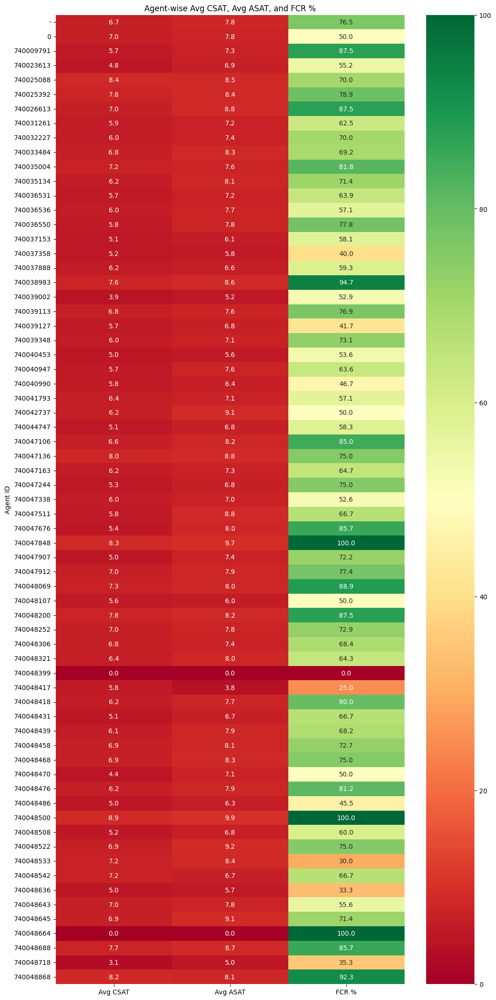

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Prepare agent summary again (if not done) ---
agent_summary = df.groupby("agentid").agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean'),
    fcr_rate=('FCR','mean')
).reset_index()

# Convert FCR to %
agent_summary['fcr_rate'] = agent_summary['fcr_rate'] * 100

# Round values
agent_summary = agent_summary.round({
    'avg_csat': 2,
    'avg_asat': 2,
    'fcr_rate': 1
})

# Rename for reporting
agent_summary = agent_summary.rename(columns={
    "agentid": "Agent ID",
    "avg_csat": "Avg CSAT",
    "avg_asat": "Avg ASAT",
    "fcr_rate": "FCR %"
})

# --- Heatmap ---
plt.figure(figsize=(12, max(8, len(agent_summary)*0.4)))
sns.heatmap(agent_summary.set_index("Agent ID"), annot=True, fmt=".1f", cmap="RdYlGn", cbar=True)
plt.title("Agent-wise Avg CSAT, Avg ASAT, and FCR %")
plt.show()


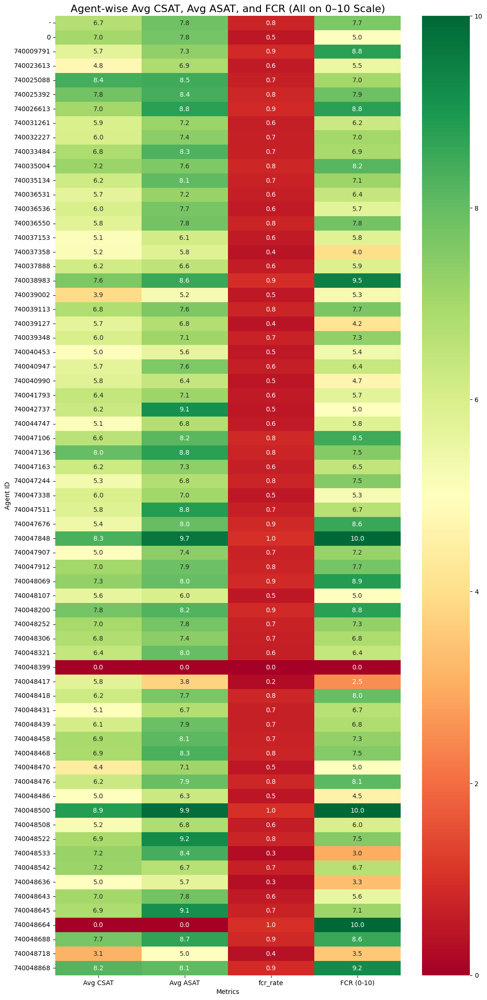

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Prepare agent summary ---
agent_summary = df.groupby("agentid").agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean'),
    fcr_rate=('FCR','mean')
).reset_index()

# Scale FCR to 0–10 instead of 0–100
agent_summary['fcr_scaled'] = agent_summary['fcr_rate'] * 10  # since FCR is 0–1

# Round for readability
agent_summary = agent_summary.round({
    'avg_csat': 2,
    'avg_asat': 2,
    'fcr_scaled': 2
})

# Rename for display
agent_summary = agent_summary.rename(columns={
    "agentid": "Agent ID",
    "avg_csat": "Avg CSAT",
    "avg_asat": "Avg ASAT",
    "fcr_scaled": "FCR (0-10)"
})

# --- Heatmap ---
plt.figure(figsize=(12, max(8, len(agent_summary)*0.4)))
sns.heatmap(
    agent_summary.set_index("Agent ID"),
    annot=True, fmt=".1f", cmap="RdYlGn", cbar=True, vmin=0, vmax=10
)
plt.title("Agent-wise Avg CSAT, Avg ASAT, and FCR (All on 0–10 Scale)", fontsize=16)
plt.ylabel("Agent ID")
plt.xlabel("Metrics")
plt.show()


📌 Overall Metrics:
 {'Avg CSAT': np.float64(6.16), 'Avg ASAT': np.float64(7.42), 'FCR %': np.float64(67.9)}


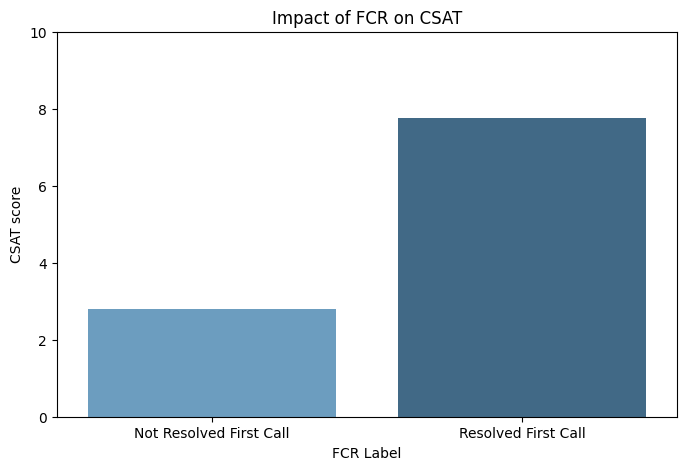

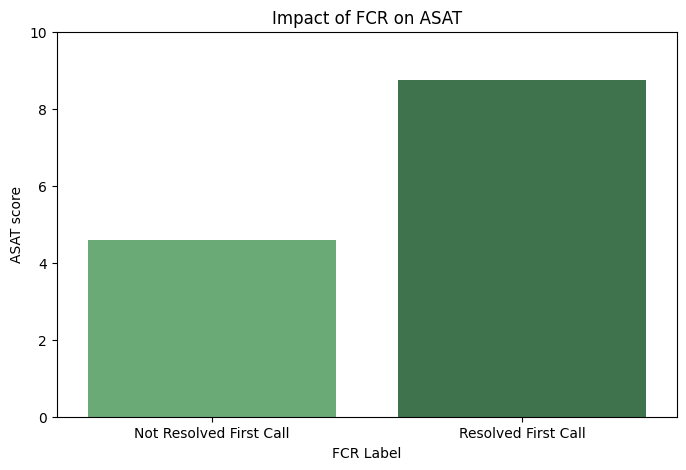

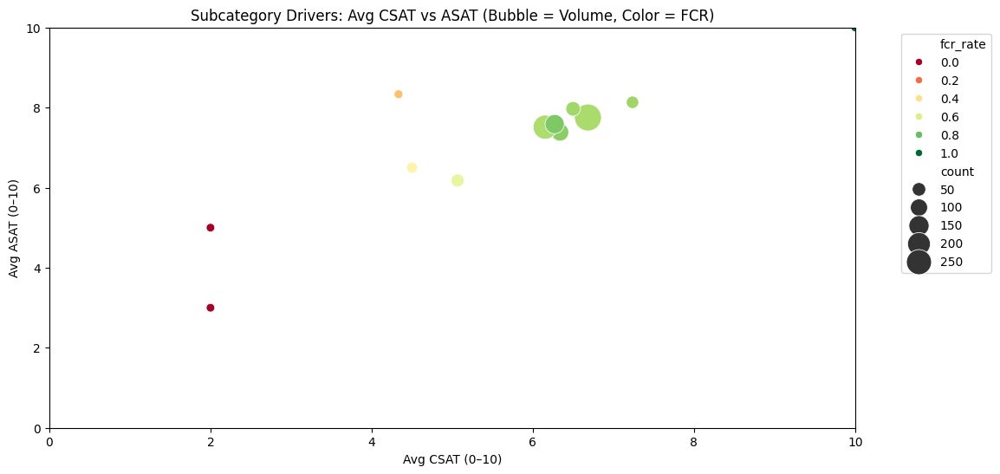

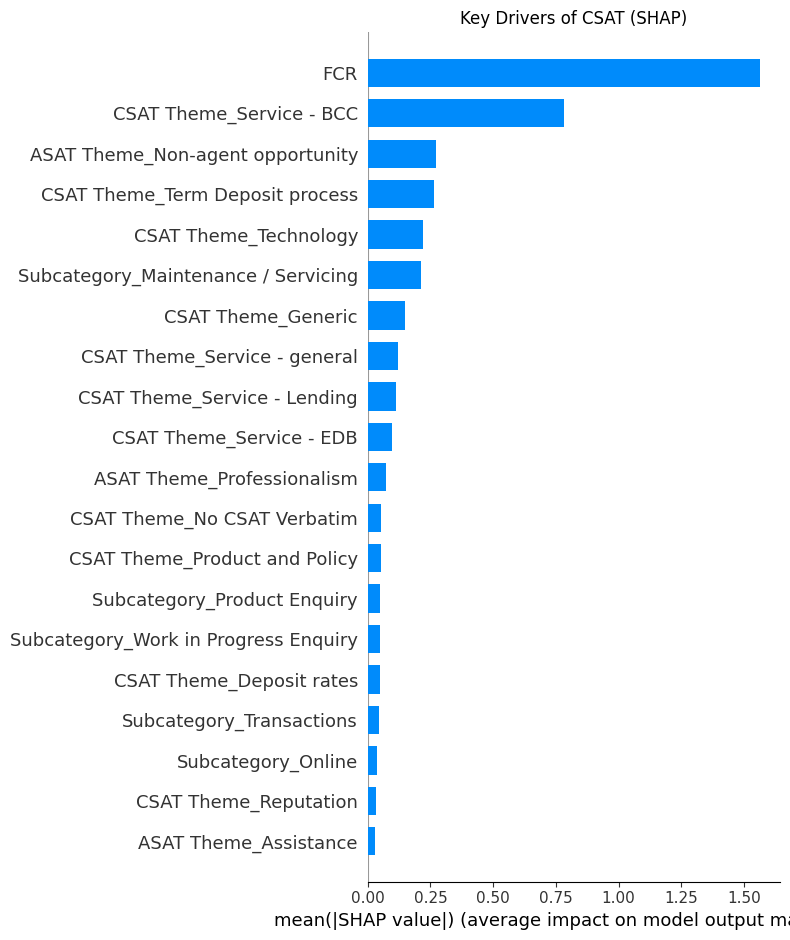

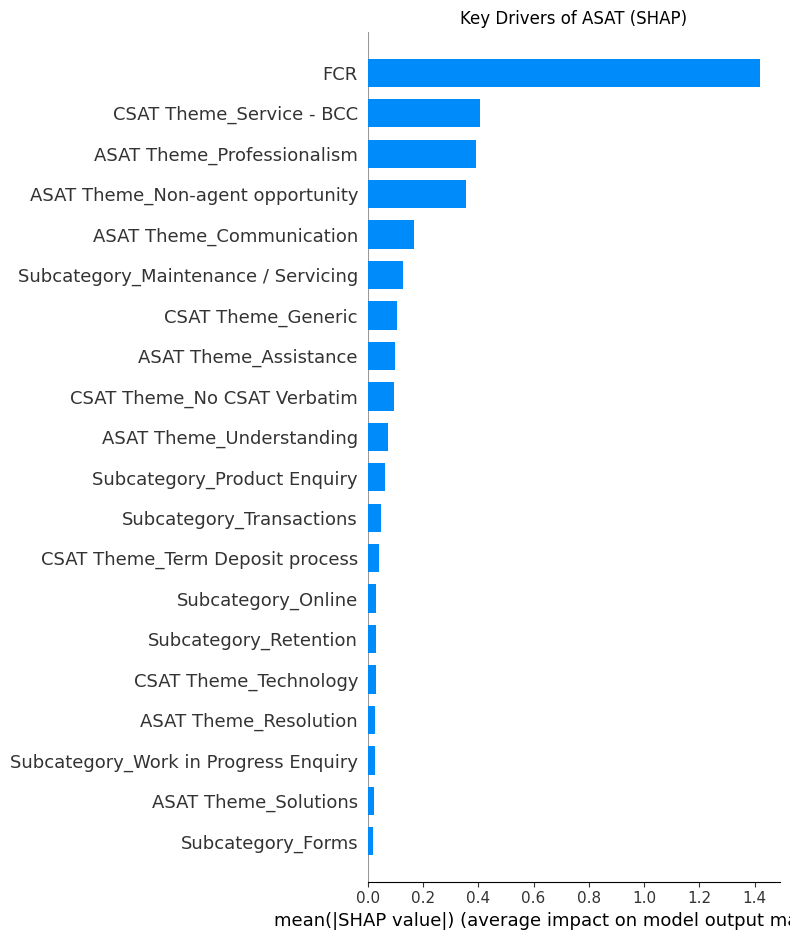

In [62]:
# ======================================================
# 0. Libraries
# ======================================================
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
import shap

# ======================================================
# 1. Data Preparation
# ======================================================
df['Completed Date 2'] = pd.to_datetime(df['Completed Date 2'], errors="coerce")
df['CSAT score'] = pd.to_numeric(df['CSAT score'], errors="coerce")
df['ASAT score'] = pd.to_numeric(df['ASAT score'], errors="coerce")

# Ensure FCR is numeric
if df['FCR'].dtype == 'object':
    df['FCR'] = df['FCR'].map({'Yes':1, 'No':0}).fillna(0).astype(float)

# ======================================================
# 2. Overall Health Check
# ======================================================
overall = {
    "Avg CSAT": df['CSAT score'].mean().round(2),
    "Avg ASAT": df['ASAT score'].mean().round(2),
    "FCR %": (df['FCR'].mean()*100).round(1)
}
print("📌 Overall Metrics:\n", overall)

# ======================================================
# 3. Impact of FCR on Scores
# ======================================================
fcr_group = df.groupby("FCR")[["CSAT score","ASAT score"]].mean().reset_index()
fcr_group["FCR Label"] = fcr_group["FCR"].map({1:"Resolved First Call",0:"Not Resolved First Call"})

plt.figure(figsize=(8,5))
sns.barplot(data=fcr_group, x="FCR Label", y="CSAT score", palette="Blues_d")
plt.title("Impact of FCR on CSAT")
plt.ylim(0,10)
plt.show()

plt.figure(figsize=(8,5))
sns.barplot(data=fcr_group, x="FCR Label", y="ASAT score", palette="Greens_d")
plt.title("Impact of FCR on ASAT")
plt.ylim(0,10)
plt.show()

# ======================================================
# 4. Subcategory Driver Analysis
# ======================================================
if "SUBCATEGORY" in df.columns:
    subcat_scores = df.groupby("SUBCATEGORY").agg(
        count=('CSAT score','size'),
        avg_csat=('CSAT score','mean'),
        avg_asat=('ASAT score','mean'),
        fcr_rate=('FCR','mean')
    ).reset_index()

    plt.figure(figsize=(12,6))
    sns.scatterplot(data=subcat_scores, x="avg_csat", y="avg_asat",
                    size="count", hue="fcr_rate", palette="RdYlGn", sizes=(50,500))
    plt.title("Subcategory Drivers: Avg CSAT vs ASAT (Bubble = Volume, Color = FCR)")
    plt.xlabel("Avg CSAT (0–10)")
    plt.ylabel("Avg ASAT (0–10)")
    plt.xlim(0,10); plt.ylim(0,10)
    plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
    plt.show()

# ======================================================
# 5. ML + SHAP Driver Analysis
# ======================================================
# Features: FCR + categorical (Subcategory, Themes if present)
X = pd.DataFrame({
    "FCR": df["FCR"],
    "Subcategory": df["SUBCATEGORY"] if "SUBCATEGORY" in df.columns else "Unknown",
    "CSAT Theme": df["CSAT Theme"] if "CSAT Theme" in df.columns else "Unknown",
    "ASAT Theme": df["ASAT Theme"] if "ASAT Theme" in df.columns else "Unknown"
})

# Encode categoricals
X = pd.get_dummies(X, drop_first=True)

# Target: CSAT
y_csat = df["CSAT score"].fillna(df["CSAT score"].mean())

# Train RF model
model_csat = RandomForestRegressor(n_estimators=200, random_state=42)
model_csat.fit(X, y_csat)

# SHAP values
explainer_csat = shap.TreeExplainer(model_csat)
shap_values_csat = explainer_csat.shap_values(X)

plt.title("Key Drivers of CSAT (SHAP)")
shap.summary_plot(shap_values_csat, X, plot_type="bar")

# Target: ASAT
y_asat = df["ASAT score"].fillna(df["ASAT score"].mean())

model_asat = RandomForestRegressor(n_estimators=200, random_state=42)
model_asat.fit(X, y_asat)

explainer_asat = shap.TreeExplainer(model_asat)
shap_values_asat = explainer_asat.shap_values(X)

plt.title("Key Drivers of ASAT (SHAP)")
shap.summary_plot(shap_values_asat, X, plot_type="bar")


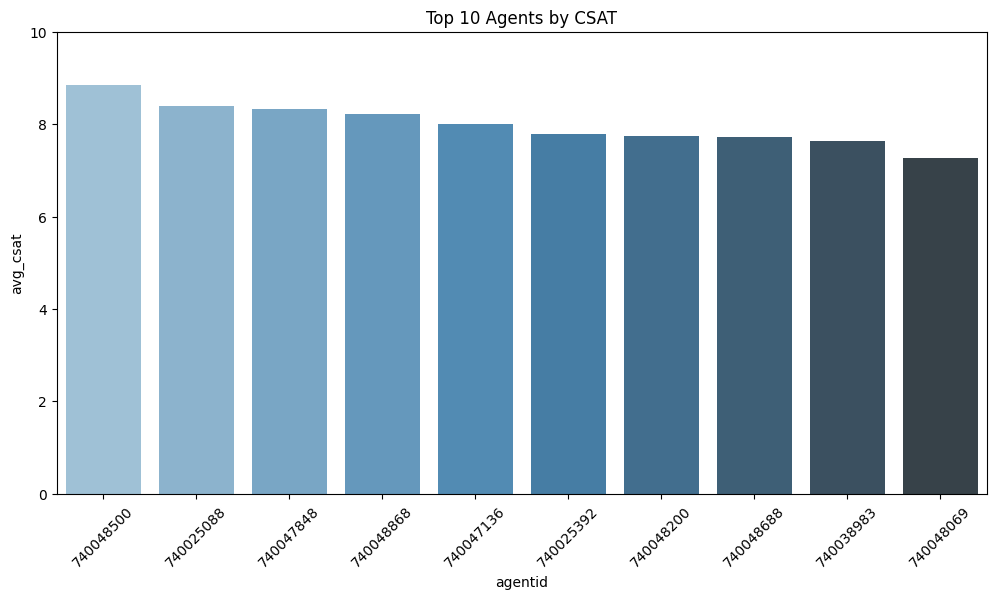

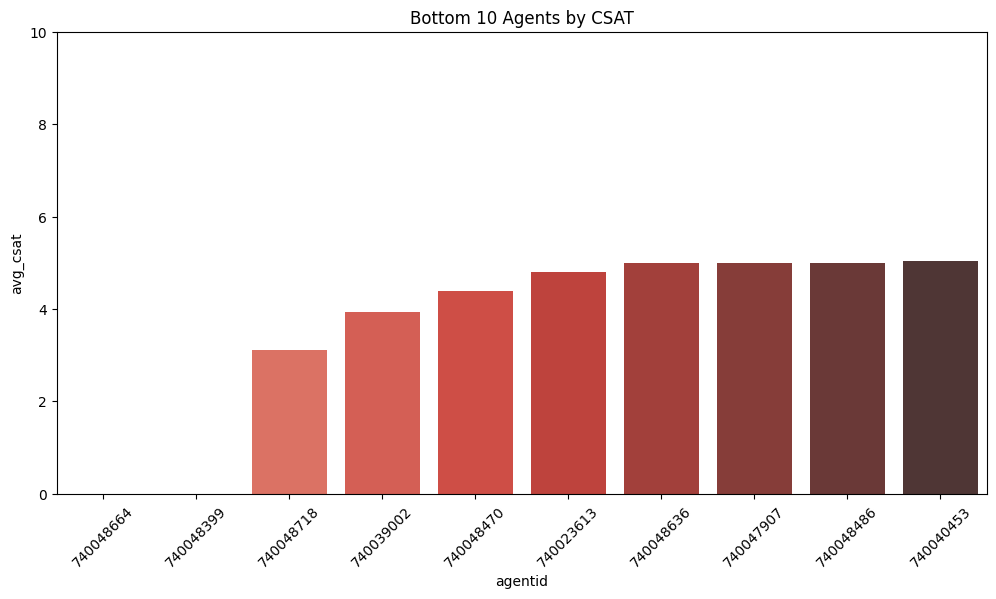

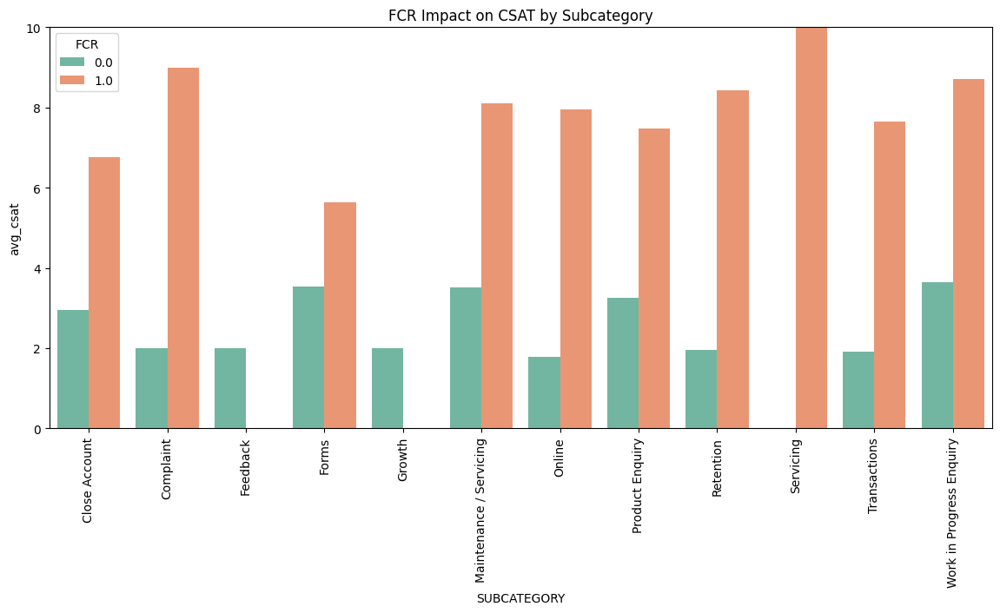

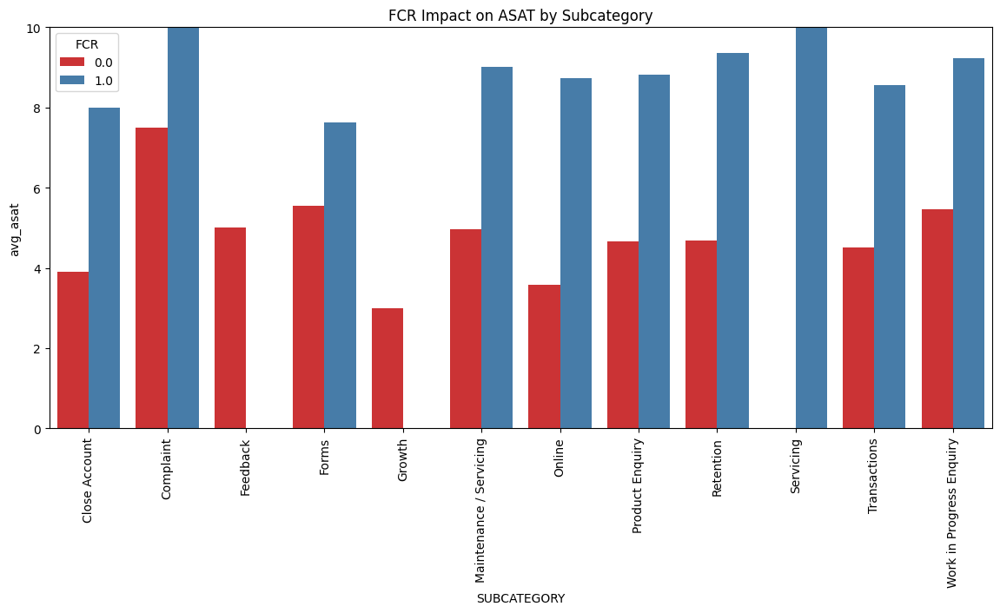

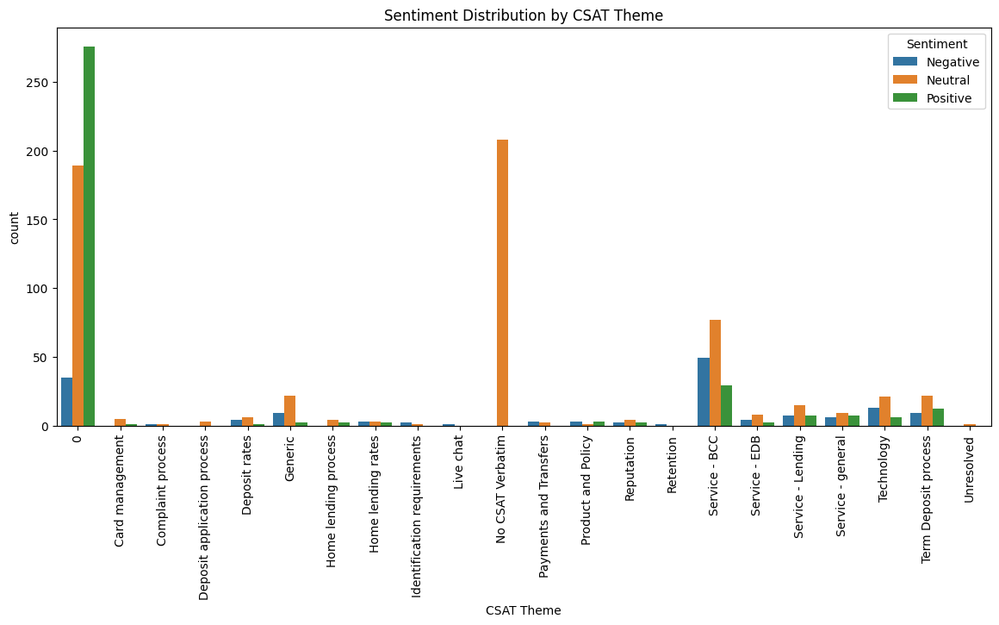

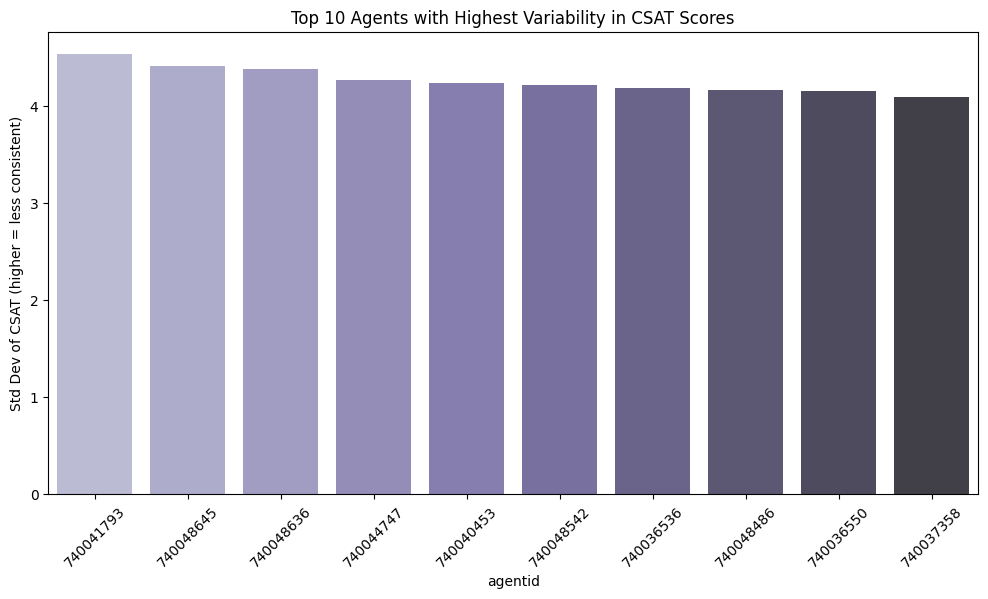

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from textblob import TextBlob

# ======================================================
# 1. Theme/Subcategory Treemap
# ======================================================
if "SUBCATEGORY" in df.columns:
    subcat_summary = df.groupby("SUBCATEGORY").agg(
        count=('CSAT score','size'),
        avg_csat=('CSAT score','mean'),
        avg_asat=('ASAT score','mean')
    ).reset_index()

    fig = px.treemap(
        subcat_summary,
        path=['SUBCATEGORY'],
        values='count',
        color='avg_csat',
        color_continuous_scale='RdYlGn',
        hover_data={'avg_asat':True}
    )
    fig.update_traces(texttemplate="%{label}<br>Count:%{value}<br>CSAT:%{color:.1f}")
    fig.update_layout(title="Treemap: Subcategory Volume & Avg CSAT (hover for ASAT)")
    fig.show()

# ======================================================
# 2. Agent Leaderboard
# ======================================================
agent_perf = df.groupby("agentid").agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean'),
    fcr_rate=('FCR','mean')
).reset_index()

top10_csat = agent_perf.sort_values("avg_csat", ascending=False).head(10)
bottom10_csat = agent_perf.sort_values("avg_csat", ascending=True).head(10)

plt.figure(figsize=(12,6))
sns.barplot(data=top10_csat, x="agentid", y="avg_csat", palette="Blues_d")
plt.title("Top 10 Agents by CSAT")
plt.ylim(0,10); plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12,6))
sns.barplot(data=bottom10_csat, x="agentid", y="avg_csat", palette="Reds_d")
plt.title("Bottom 10 Agents by CSAT")
plt.ylim(0,10); plt.xticks(rotation=45)
plt.show()

# ======================================================
# 3. FCR Impact by Subcategory
# ======================================================
if "SUBCATEGORY" in df.columns:
    fcr_subcat = df.groupby(["SUBCATEGORY","FCR"]).agg(
        avg_csat=('CSAT score','mean'),
        avg_asat=('ASAT score','mean'),
        count=('CSAT score','size')
    ).reset_index()

    plt.figure(figsize=(14,6))
    sns.barplot(data=fcr_subcat, x="SUBCATEGORY", y="avg_csat", hue="FCR", palette="Set2")
    plt.title("FCR Impact on CSAT by Subcategory")
    plt.xticks(rotation=90)
    plt.ylim(0,10)
    plt.show()

    plt.figure(figsize=(14,6))
    sns.barplot(data=fcr_subcat, x="SUBCATEGORY", y="avg_asat", hue="FCR", palette="Set1")
    plt.title("FCR Impact on ASAT by Subcategory")
    plt.xticks(rotation=90)
    plt.ylim(0,10)
    plt.show()

# ======================================================
# 4. Sentiment by Theme (using CSAT feedback text)
# ======================================================
if "csat_feedback" in df.columns:
    def get_sentiment(text):
        if pd.isna(text): return "Neutral"
        score = TextBlob(str(text)).sentiment.polarity
        if score > 0.1: return "Positive"
        elif score < -0.1: return "Negative"
        else: return "Neutral"

    df['Sentiment'] = df['csat_feedback'].apply(get_sentiment)

    sentiment_theme = df.groupby(['CSAT Theme','Sentiment']).size().reset_index(name="count")

    plt.figure(figsize=(14,6))
    sns.barplot(data=sentiment_theme, x="CSAT Theme", y="count", hue="Sentiment")
    plt.title("Sentiment Distribution by CSAT Theme")
    plt.xticks(rotation=90)
    plt.show()

# ======================================================
# 5. Agent Consistency (Variance in Scores)
# ======================================================
agent_consistency = df.groupby("agentid").agg(
    csat_var=('CSAT score','std'),
    asat_var=('ASAT score','std')
).reset_index().fillna(0)

plt.figure(figsize=(12,6))
sns.barplot(data=agent_consistency.sort_values("csat_var", ascending=False).head(10),
            x="agentid", y="csat_var", palette="Purples_d")
plt.title("Top 10 Agents with Highest Variability in CSAT Scores")
plt.ylabel("Std Dev of CSAT (higher = less consistent)")
plt.xticks(rotation=45)
plt.show()


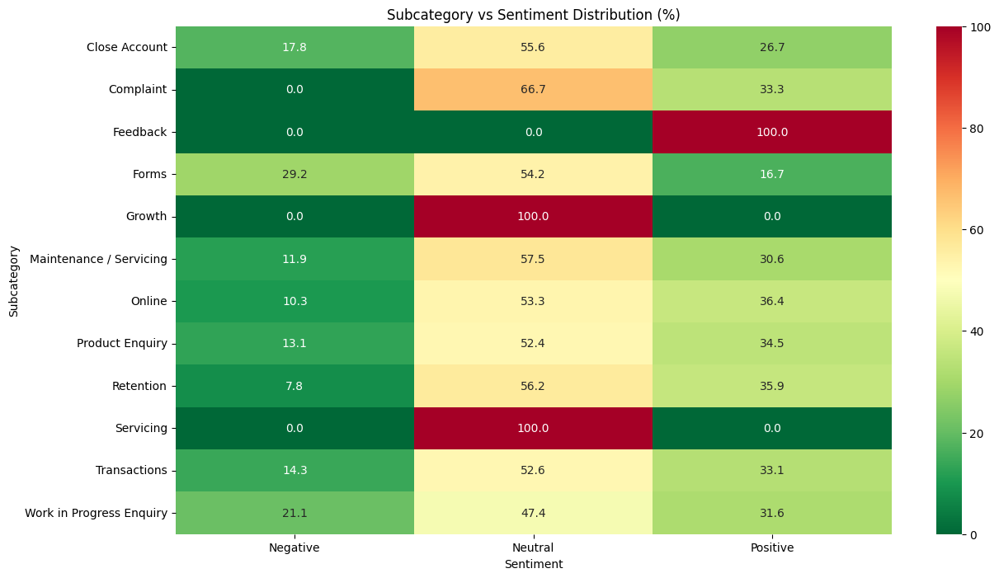

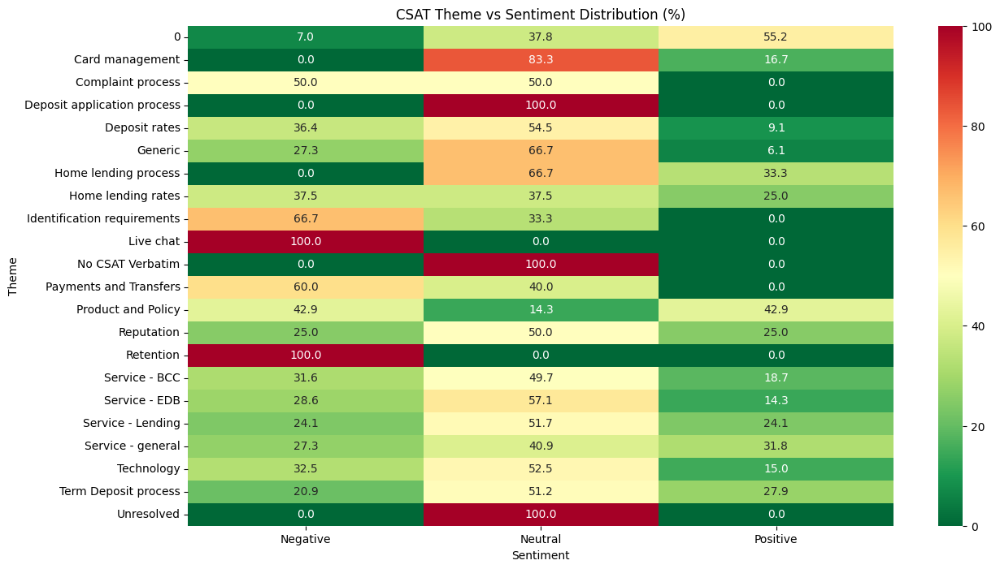

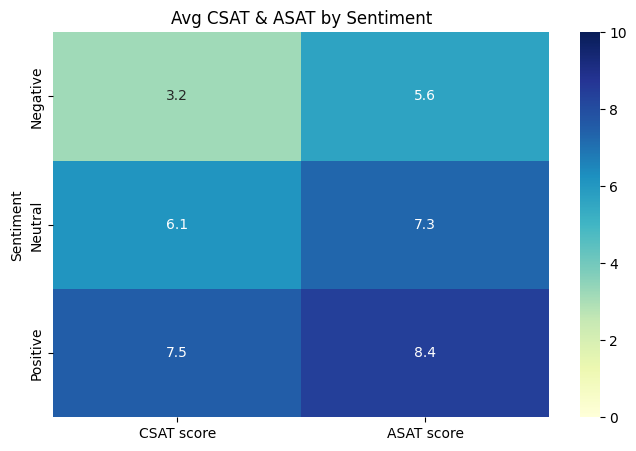

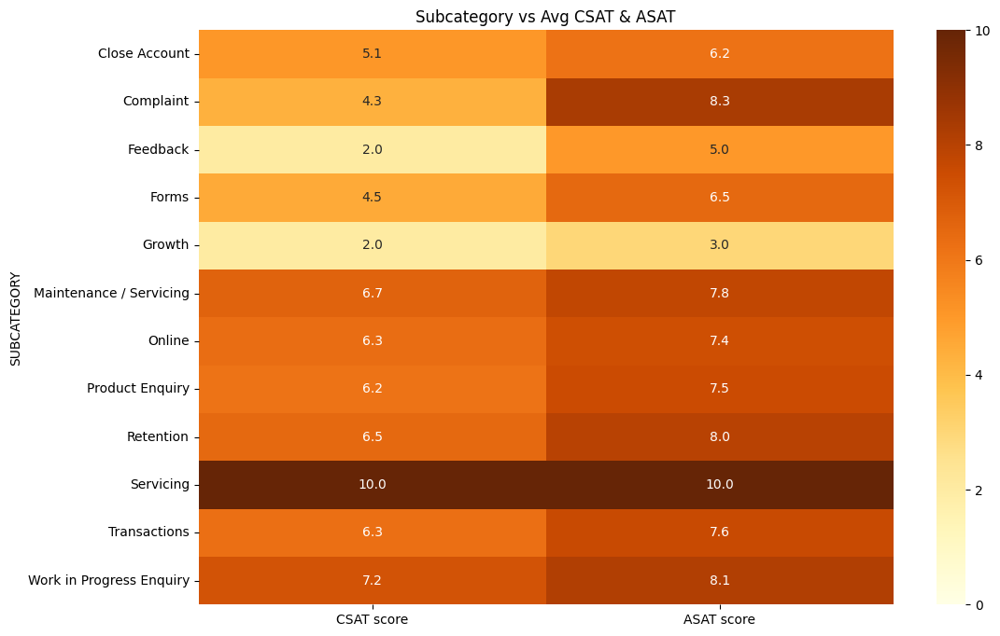

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

# --- Sentiment by Subcategory ---
if "SUBCATEGORY" in df.columns:
    subcat_sentiment = df.groupby(["SUBCATEGORY","Sentiment"]).size().unstack(fill_value=0)
    subcat_sentiment_pct = subcat_sentiment.div(subcat_sentiment.sum(axis=1), axis=0) * 100

    plt.figure(figsize=(14,8))
    sns.heatmap(subcat_sentiment_pct, annot=True, fmt=".1f", cmap="RdYlGn_r")
    plt.title("Subcategory vs Sentiment Distribution (%)")
    plt.ylabel("Subcategory"); plt.xlabel("Sentiment")
    plt.show()

# --- Sentiment by CSAT Theme ---
if "CSAT Theme" in df.columns:
    theme_sentiment = df.groupby(["CSAT Theme","Sentiment"]).size().unstack(fill_value=0)
    theme_sentiment_pct = theme_sentiment.div(theme_sentiment.sum(axis=1), axis=0) * 100

    plt.figure(figsize=(14,8))
    sns.heatmap(theme_sentiment_pct, annot=True, fmt=".1f", cmap="RdYlGn_r")
    plt.title("CSAT Theme vs Sentiment Distribution (%)")
    plt.ylabel("Theme"); plt.xlabel("Sentiment")
    plt.show()

# --- Sentiment vs Avg Scores ---
sentiment_scores = df.groupby("Sentiment")[["CSAT score","ASAT score"]].mean()

plt.figure(figsize=(8,5))
sns.heatmap(sentiment_scores, annot=True, fmt=".1f", cmap="YlGnBu", vmin=0, vmax=10)
plt.title("Avg CSAT & ASAT by Sentiment")
plt.show()

# --- Subcategory vs Avg Scores ---
if "SUBCATEGORY" in df.columns:
    subcat_scores = df.groupby("SUBCATEGORY")[["CSAT score","ASAT score"]].mean()

    plt.figure(figsize=(12,8))
    sns.heatmap(subcat_scores, annot=True, fmt=".1f", cmap="YlOrBr", vmin=0, vmax=10)
    plt.title("Subcategory vs Avg CSAT & ASAT")
    plt.show()


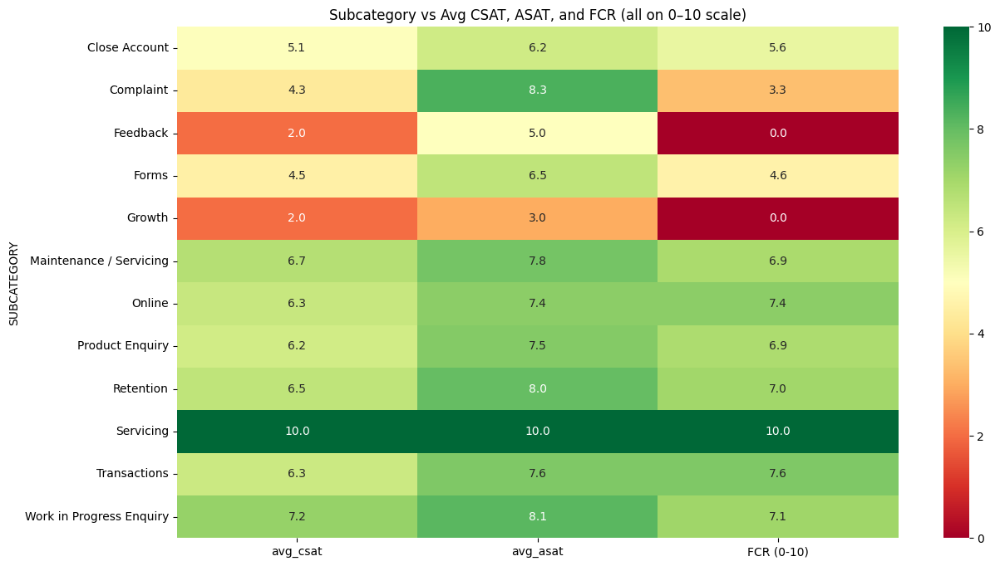

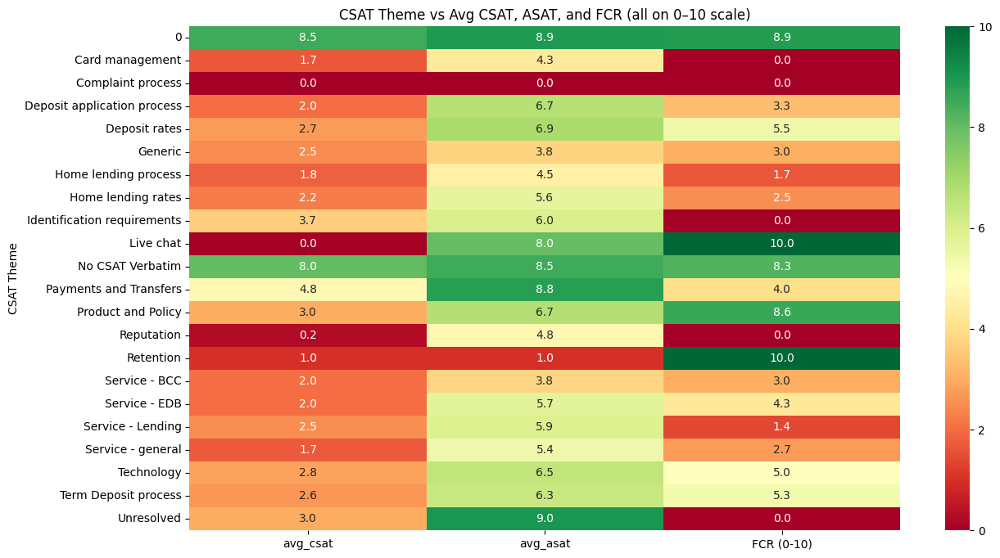

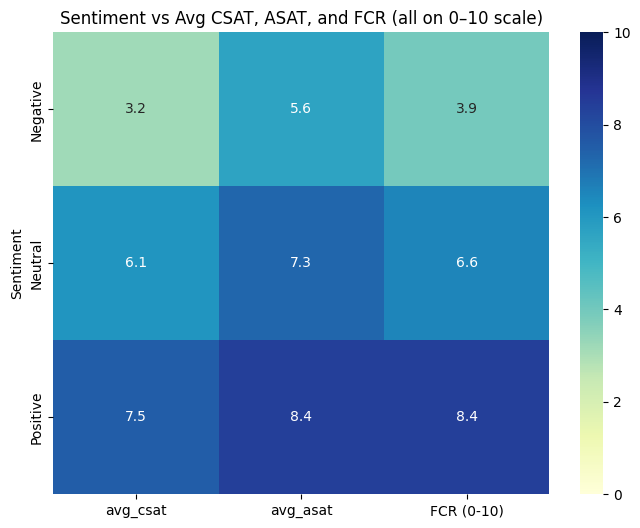

In [66]:
import seaborn as sns
import matplotlib.pyplot as plt

# --- Subcategory Heatmap (Scores + FCR 0-10) ---
if "SUBCATEGORY" in df.columns:
    subcat_scores = df.groupby("SUBCATEGORY").agg(
        avg_csat=('CSAT score','mean'),
        avg_asat=('ASAT score','mean'),
        fcr_rate=('FCR','mean')
    ).reset_index()

    # Convert FCR to 0–10 scale
    subcat_scores["FCR (0-10)"] = subcat_scores["fcr_rate"] * 10

    plt.figure(figsize=(14,8))
    sns.heatmap(
        subcat_scores.set_index("SUBCATEGORY")[["avg_csat","avg_asat","FCR (0-10)"]],
        annot=True, fmt=".1f", cmap="RdYlGn", vmin=0, vmax=10
    )
    plt.title("Subcategory vs Avg CSAT, ASAT, and FCR (all on 0–10 scale)")
    plt.show()

# --- Theme Heatmap (Scores + FCR 0-10) ---
if "CSAT Theme" in df.columns:
    theme_scores = df.groupby("CSAT Theme").agg(
        avg_csat=('CSAT score','mean'),
        avg_asat=('ASAT score','mean'),
        fcr_rate=('FCR','mean')
    ).reset_index()

    theme_scores["FCR (0-10)"] = theme_scores["fcr_rate"] * 10

    plt.figure(figsize=(14,8))
    sns.heatmap(
        theme_scores.set_index("CSAT Theme")[["avg_csat","avg_asat","FCR (0-10)"]],
        annot=True, fmt=".1f", cmap="RdYlGn", vmin=0, vmax=10
    )
    plt.title("CSAT Theme vs Avg CSAT, ASAT, and FCR (all on 0–10 scale)")
    plt.show()

# --- Sentiment Heatmap (Scores + FCR 0-10) ---
sentiment_scores = df.groupby("Sentiment").agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean'),
    fcr_rate=('FCR','mean')
).reset_index()

sentiment_scores["FCR (0-10)"] = sentiment_scores["fcr_rate"] * 10

plt.figure(figsize=(8,6))
sns.heatmap(
    sentiment_scores.set_index("Sentiment")[["avg_csat","avg_asat","FCR (0-10)"]],
    annot=True, fmt=".1f", cmap="YlGnBu", vmin=0, vmax=10
)
plt.title("Sentiment vs Avg CSAT, ASAT, and FCR (all on 0–10 scale)")
plt.show()


In [57]:
import pandas as pd

# --- Aggregate agent-level averages ---
agent_summary = df.groupby("agentid").agg(
    avg_csat=('CSAT score','mean'),
    avg_asat=('ASAT score','mean'),
    fcr_rate=('FCR','mean')
).reset_index()

# Convert FCR to %
agent_summary['fcr_rate'] = agent_summary['fcr_rate'] * 100

# Round values for clarity
agent_summary = agent_summary.round({
    'avg_csat': 2,
    'avg_asat': 2,
    'fcr_rate': 1
})

# Rename columns for reporting
agent_summary = agent_summary.rename(columns={
    "agentid": "Agent ID",
    "avg_csat": "Avg CSAT",
    "avg_asat": "Avg ASAT",
    "fcr_rate": "FCR %"
})

print("📌 Agent-wise Summary (first 15 rows):\n")
print(agent_summary.head(15))


📌 Agent-wise Summary (first 15 rows):

     Agent ID  Avg CSAT  Avg ASAT  FCR %
0           -      6.71      7.82   76.5
1           0      7.00      7.75   50.0
2   740009791      5.71      7.33   87.5
3   740023613      4.79      6.86   55.2
4   740025088      8.40      8.50   70.0
5   740025392      7.79      8.42   78.9
6   740026613      7.00      8.75   87.5
7   740031261      5.94      7.16   62.5
8   740032227      6.00      7.40   70.0
9   740033484      6.85      8.31   69.2
10  740035004      7.18      7.59   81.8
11  740035134      6.19      8.05   71.4
12  740036531      5.69      7.22   63.9
13  740036536      6.00      7.71   57.1
14  740036550      5.78      7.81   77.8



📌 Agent-level averages:
      agentid  CSAT score  ASAT score
0          -    6.705882    7.823529
1          0    7.000000    7.750000
2  740009791    5.708333    7.333333
3  740023613    4.793103    6.862069
4  740025088    8.400000    8.500000

📌 Top 10 Agents by Avg ASAT:
       agentid  CSAT score  ASAT score
55  740048500    8.857143    9.857143
36  740047848    8.333333    9.666667
57  740048522    6.875000    9.250000
62  740048645    6.857143    9.142857
27  740042737    6.250000    9.125000
34  740047511    5.833333    8.833333
6   740026613    7.000000    8.750000
30  740047136    8.000000    8.750000
64  740048688    7.714286    8.714286
18  740038983    7.631579    8.578947

📌 Bottom 10 Agents by Avg ASAT:
       agentid  CSAT score  ASAT score
63  740048664    0.000000    0.000000
45  740048399    0.000000    0.000000
46  740048417    5.750000    3.750000
65  740048718    3.117647    5.000000
19  740039002    3.941176    5.235294
23  740040453    5.035714    5.642857
60 

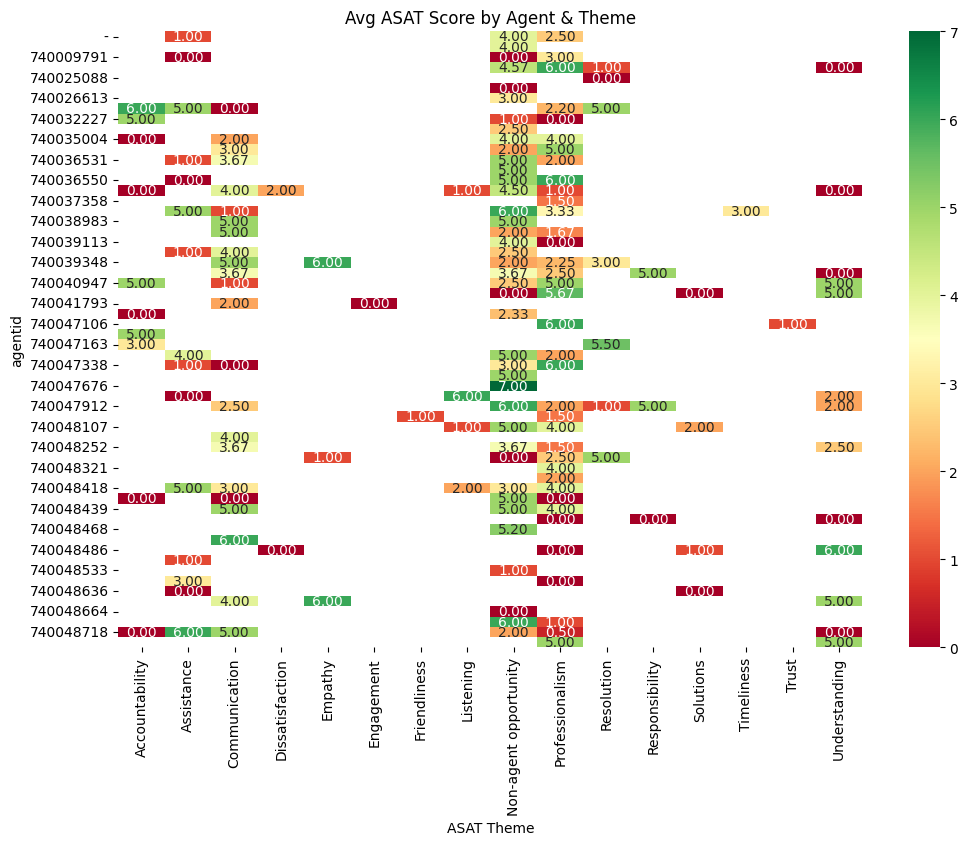

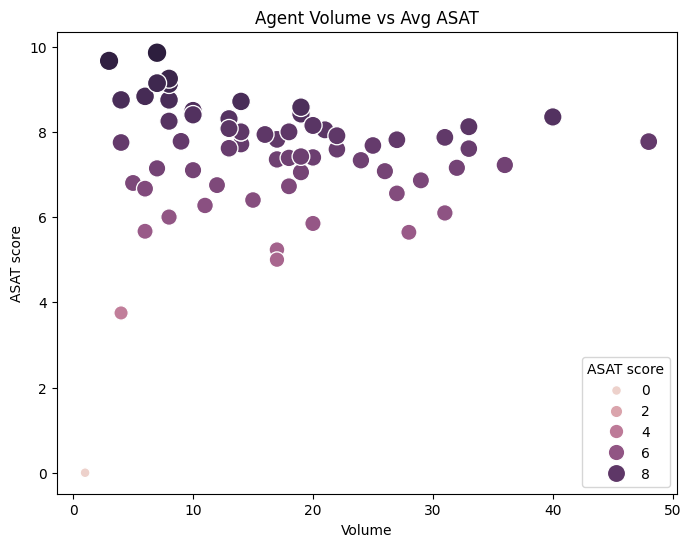

In [34]:
    print("⚠️ Required columns ('agentid' and at least one score column) not found in the dataset.")



📌 Top 10 Agents by Avg CSAT:
       agentid  CSAT score  ASAT score
55  740048500    8.857143    9.857143
4   740025088    8.400000    8.500000
36  740047848    8.333333    9.666667
66  740048868    8.230769    8.076923
30  740047136    8.000000    8.750000
5   740025392    7.789474    8.421053
41  740048200    7.750000    8.250000
64  740048688    7.714286    8.714286
18  740038983    7.631579    8.578947
39  740048069    7.277778    8.000000

📌 Bottom 10 Agents by Avg CSAT:
       agentid  CSAT score  ASAT score
63  740048664    0.000000    0.000000
45  740048399    0.000000    0.000000
65  740048718    3.117647    5.000000
19  740039002    3.941176    5.235294
52  740048470    4.400000    7.100000
3   740023613    4.793103    6.862069
60  740048636    5.000000    5.666667
37  740047907    5.000000    7.388889
54  740048486    5.000000    6.272727
23  740040453    5.035714    5.642857


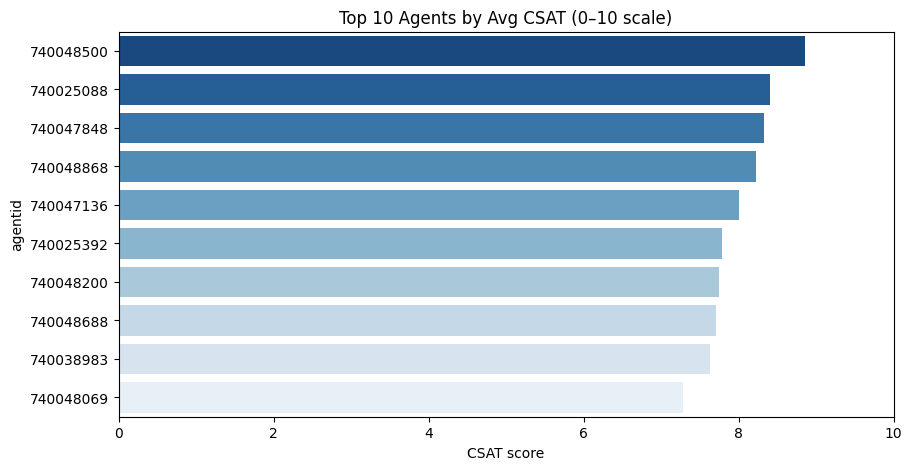

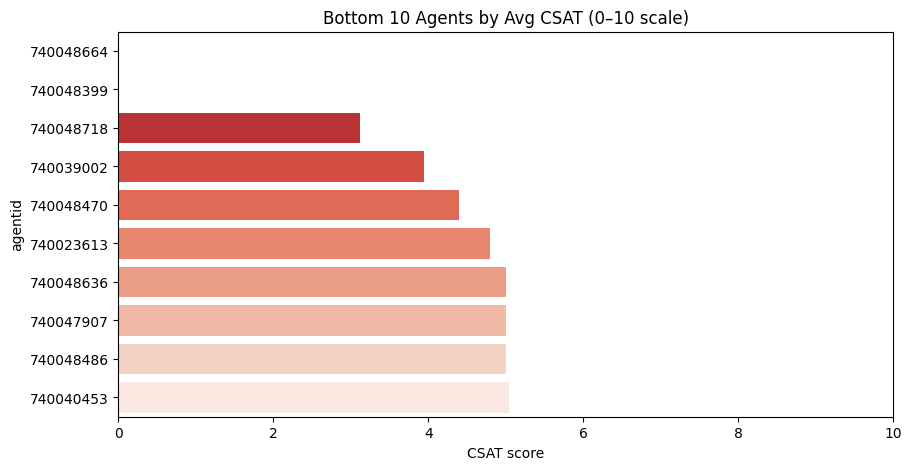


📌 Top 10 Agents by Avg ASAT:
       agentid  CSAT score  ASAT score
55  740048500    8.857143    9.857143
36  740047848    8.333333    9.666667
57  740048522    6.875000    9.250000
62  740048645    6.857143    9.142857
27  740042737    6.250000    9.125000
34  740047511    5.833333    8.833333
6   740026613    7.000000    8.750000
30  740047136    8.000000    8.750000
64  740048688    7.714286    8.714286
18  740038983    7.631579    8.578947

📌 Bottom 10 Agents by Avg ASAT:
       agentid  CSAT score  ASAT score
63  740048664    0.000000    0.000000
45  740048399    0.000000    0.000000
46  740048417    5.750000    3.750000
65  740048718    3.117647    5.000000
19  740039002    3.941176    5.235294
23  740040453    5.035714    5.642857
60  740048636    5.000000    5.666667
16  740037358    5.150000    5.850000
40  740048107    5.625000    6.000000
15  740037153    5.096774    6.096774


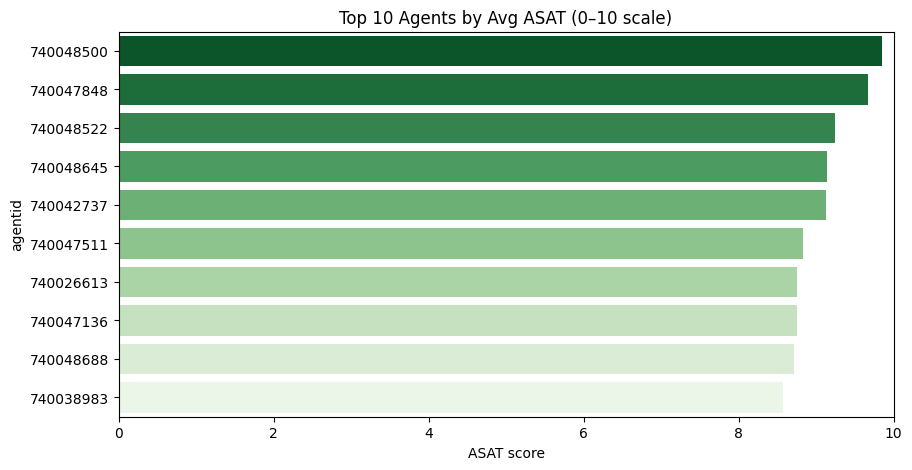

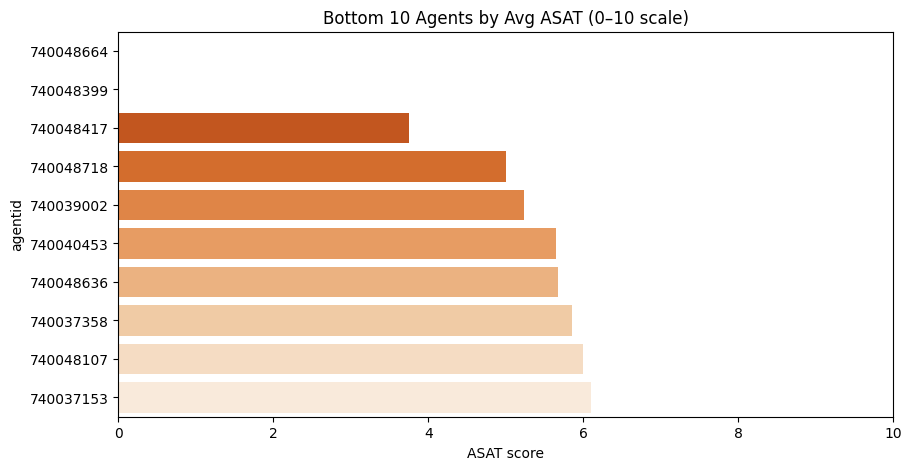

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Make sure correct column names ---
rename_map = {
    'How would you rate the service you received from the consultant handling your enquiry?': 'ASAT score',
    'What are your most important reasons for giving us that score?': 'csat_feedback',
    'ID': 'agentid'
}
df = df.rename(columns={k:v for k,v in rename_map.items() if k in df.columns})

# --- Keep only numeric score columns ---
score_cols = [c for c in ["CSAT score","ASAT score"] if c in df.columns]

# --- Compute agent-level averages ---
agent_scores = df.groupby("agentid")[score_cols].mean().reset_index()

# --- Top & Bottom 10 by CSAT ---
if "CSAT score" in agent_scores.columns:
    top_csat = agent_scores.sort_values(by="CSAT score", ascending=False).head(10)
    bottom_csat = agent_scores.sort_values(by="CSAT score", ascending=True).head(10)

    print("\n📌 Top 10 Agents by Avg CSAT:\n", top_csat)
    print("\n📌 Bottom 10 Agents by Avg CSAT:\n", bottom_csat)

    # --- Chart ---
    plt.figure(figsize=(10,5))
    sns.barplot(x="CSAT score", y="agentid", data=top_csat, palette="Blues_r")
    plt.title("Top 10 Agents by Avg CSAT (0–10 scale)")
    plt.xlim(0,10)
    plt.show()

    plt.figure(figsize=(10,5))
    sns.barplot(x="CSAT score", y="agentid", data=bottom_csat, palette="Reds_r")
    plt.title("Bottom 10 Agents by Avg CSAT (0–10 scale)")
    plt.xlim(0,10)
    plt.show()

# --- Top & Bottom 10 by ASAT ---
if "ASAT score" in agent_scores.columns:
    top_asat = agent_scores.sort_values(by="ASAT score", ascending=False).head(10)
    bottom_asat = agent_scores.sort_values(by="ASAT score", ascending=True).head(10)

    print("\n📌 Top 10 Agents by Avg ASAT:\n", top_asat)
    print("\n📌 Bottom 10 Agents by Avg ASAT:\n", bottom_asat)

    # --- Chart ---
    plt.figure(figsize=(10,5))
    sns.barplot(x="ASAT score", y="agentid", data=top_asat, palette="Greens_r")
    plt.title("Top 10 Agents by Avg ASAT (0–10 scale)")
    plt.xlim(0,10)
    plt.show()

    plt.figure(figsize=(10,5))
    sns.barplot(x="ASAT score", y="agentid", data=bottom_asat, palette="Oranges_r")
    plt.title("Bottom 10 Agents by Avg ASAT (0–10 scale)")
    plt.xlim(0,10)
    plt.show()


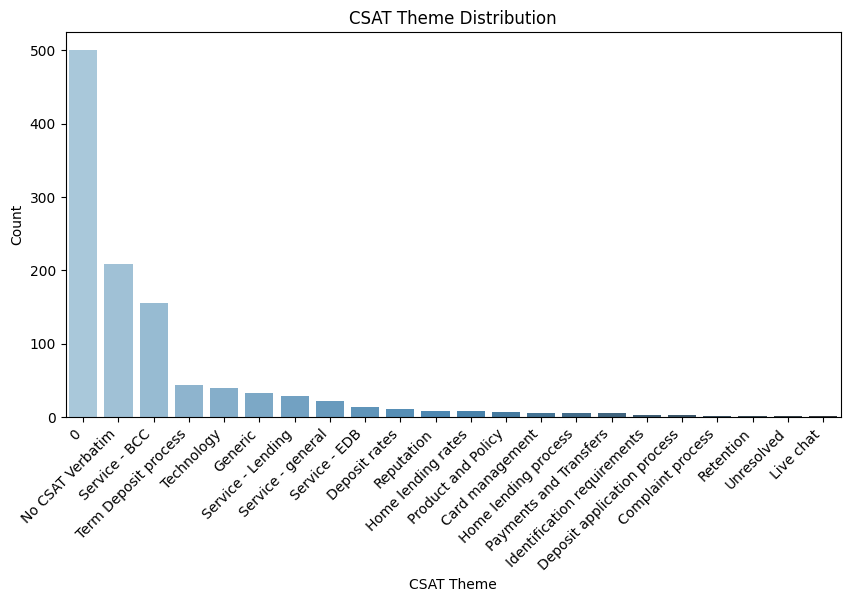

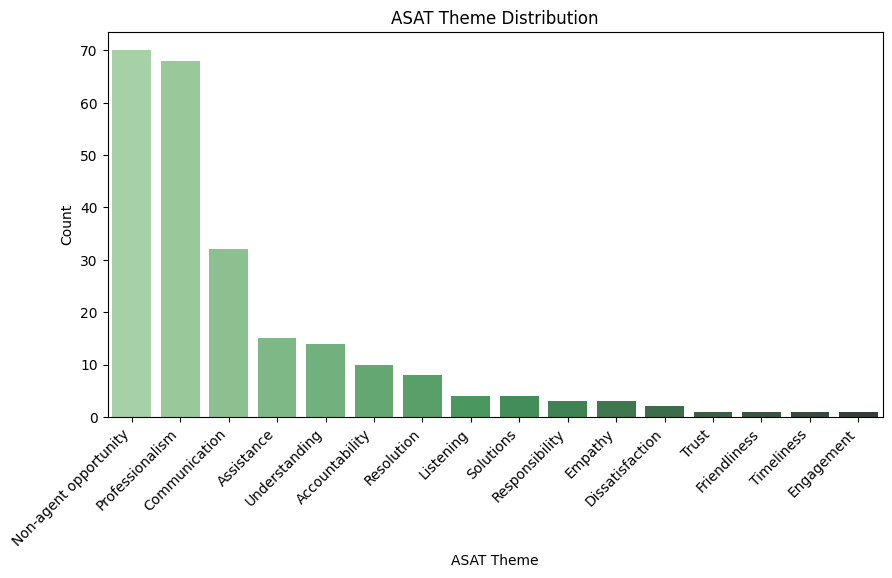

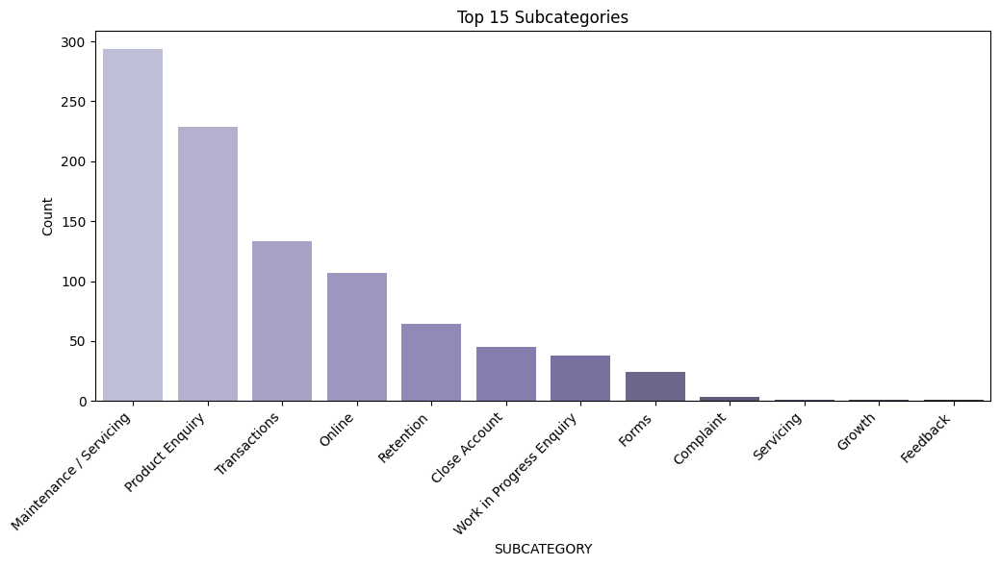

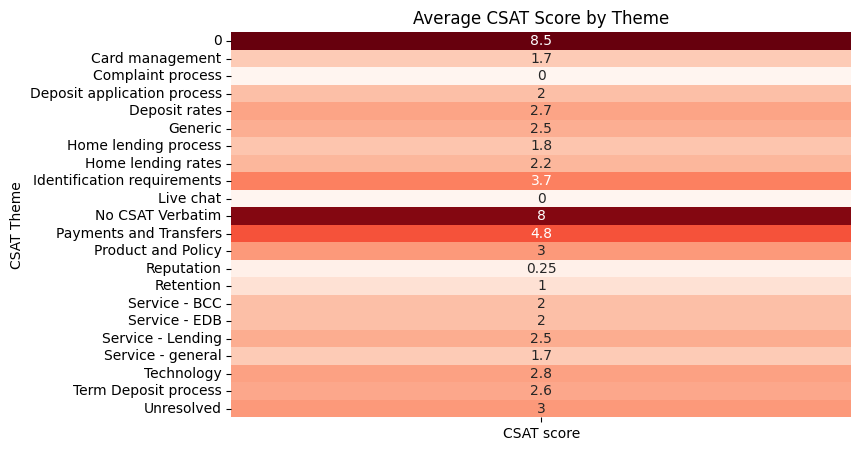


📌 Average CSAT Score by Theme & Subcategory:

              CSAT Theme               SUBCATEGORY  CSAT score
11     Complaint process           Product Enquiry    0.000000
18               Generic             Close Account    0.000000
26  Home lending process             Close Account    0.000000
52            Reputation   Maintenance / Servicing    0.000000
49    Product and Policy                    Online    0.000000
55            Reputation                 Retention    0.000000
53            Reputation                    Online    0.000000
36             Live chat           Product Enquiry    0.000000
81     Service - general                 Complaint    0.000000
84     Service - general                    Online    0.000000
94            Technology  Work in Progress Enquiry    0.000000
88            Technology             Close Account    0.000000
75     Service - Lending                    Online    0.000000
66         Service - EDB             Close Account    0.000000
87     S

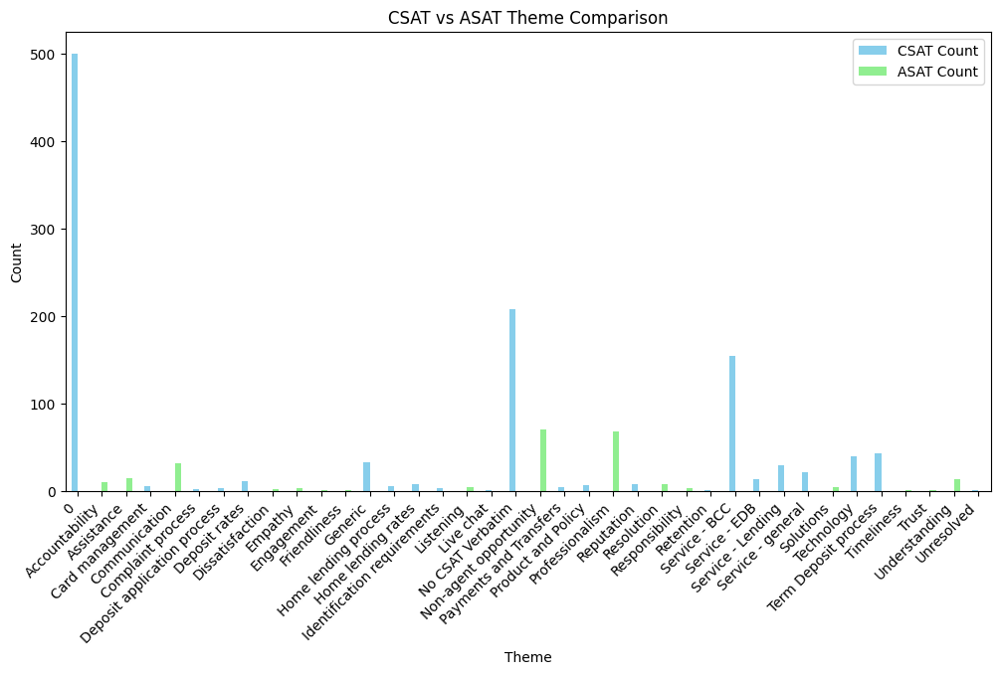

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# --- Load your data ---
# df = pd.read_csv("new_onepager.csv")

# ==========================================================
# 1. CSAT Theme Distribution
# ==========================================================
csat_counts = df['CSAT Theme'].value_counts(dropna=False)
plt.figure(figsize=(10,5))
sns.barplot(x=csat_counts.index, y=csat_counts.values, palette="Blues_d")
plt.title("CSAT Theme Distribution")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.show()

# ==========================================================
# 2. ASAT Theme Distribution
# ==========================================================
asat_counts = df['ASAT Theme'].value_counts(dropna=False)
plt.figure(figsize=(10,5))
sns.barplot(x=asat_counts.index, y=asat_counts.values, palette="Greens_d")
plt.title("ASAT Theme Distribution")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.show()

# ==========================================================
# 3. Subcategory Distribution
# ==========================================================
subcat_counts = df['SUBCATEGORY'].value_counts(dropna=False)
plt.figure(figsize=(12,5))
sns.barplot(x=subcat_counts.index[:15], y=subcat_counts.values[:15], palette="Purples_d")
plt.title("Top 15 Subcategories")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.show()

# ==========================================================
# 4. CSAT Theme → Subcategory Drill-down (Treemap)
# ==========================================================
theme_subcat = df.groupby(['CSAT Theme','SUBCATEGORY']).size().reset_index(name='count')
fig = px.treemap(theme_subcat, path=['CSAT Theme','SUBCATEGORY'], values='count',
                 color='count', color_continuous_scale='Blues',
                 title="CSAT Themes → Subcategories")
fig.show()

# ==========================================================
# 5. Average CSAT Score by Theme & Subcategory
# ==========================================================
if 'CSAT score' in df.columns:
    csat_avg_theme = df.groupby('CSAT Theme')['CSAT score'].mean().reset_index()
    csat_avg_subcat = df.groupby(['CSAT Theme','SUBCATEGORY'])['CSAT score'].mean().reset_index()

    plt.figure(figsize=(8,5))
    sns.heatmap(csat_avg_theme.set_index('CSAT Theme'), annot=True, cmap="Reds", cbar=False)
    plt.title("Average CSAT Score by Theme")
    plt.show()

    print("\n📌 Average CSAT Score by Theme & Subcategory:\n")
    print(csat_avg_subcat.sort_values(by="CSAT score").head(15))

# ==========================================================
# 6. Weekly Trend of CSAT Themes
# ==========================================================
if 'completed date2' in df.columns:
    df['completed date2'] = pd.to_datetime(df['completed date2'], errors='coerce')
    df['Week'] = df['completed date2'].dt.to_period('W').apply(lambda r: r.start_time)

    weekly_trend = df.groupby(['Week','CSAT Theme']).size().reset_index(name='count')

    plt.figure(figsize=(12,6))
    sns.lineplot(data=weekly_trend, x='Week', y='count', hue='CSAT Theme', marker="o")
    plt.title("Weekly Trend of CSAT Themes")
    plt.xticks(rotation=45)
    plt.show()

# ==========================================================
# 7. CSAT vs ASAT Theme Comparison
# ==========================================================
csat_theme_summary = df['CSAT Theme'].value_counts().rename_axis('Theme').reset_index(name='CSAT Count')
asat_theme_summary = df['ASAT Theme'].value_counts().rename_axis('Theme').reset_index(name='ASAT Count')

comparison = pd.merge(csat_theme_summary, asat_theme_summary, on="Theme", how="outer").fillna(0)

comparison.plot(x="Theme", kind="bar", figsize=(12,6), color=["skyblue","lightgreen"])
plt.title("CSAT vs ASAT Theme Comparison")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.show()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!



📌 Top 5 CSAT Final Themes:
 CSAT_Final_Theme
Account Call Amp Service Time Phone Customer    891
See Right                                       195
                                                 20
Name: count, dtype: int64

📌 Top 5 ASAT Final Themes:
 ASAT_Final_Theme
Amp Helpful Issue Call Question Polite Could             812
Sure                                                     260
Helpful Comment Per Helpfull Honest Probably Thorough     20
Good Excellent Carl Awesome Amazing Bad Best              12
Other                                                      2
Name: count, dtype: int64


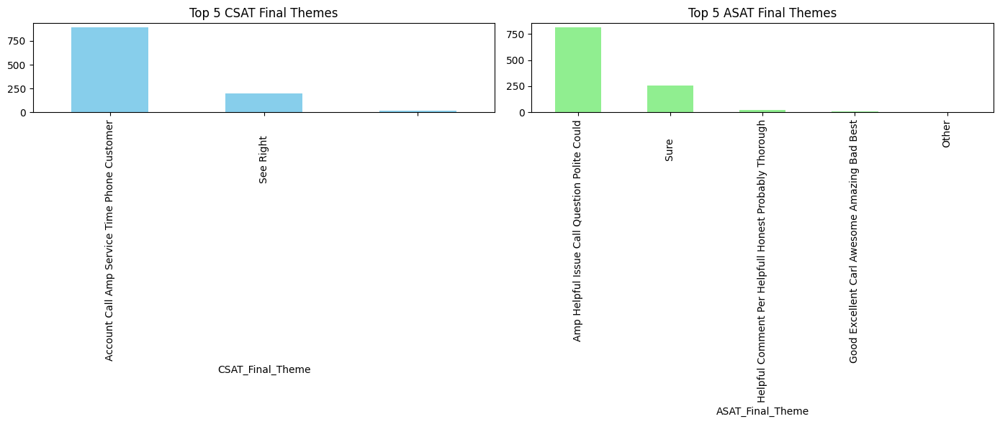

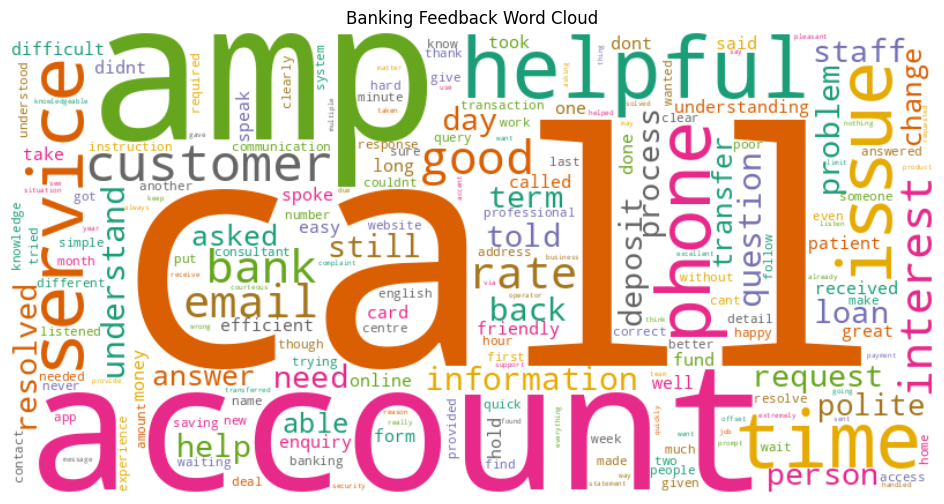

In [19]:
import pandas as pd
import re, nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# --- NLTK setup ---
nltk.download('stopwords')
nltk.download('wordnet')
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

# --- Load & rename ---
# df = pd.read_csv("new_onepager.csv")   # <-- use your file
df = df.rename(columns={
    'How would you rate the service you received from the consultant handling your enquiry?': 'ASAT score',
    'What are your most important reasons for giving us that score?': 'csat_feedback',
    'ID': 'agentid'
})
df['ASAT_feedback'] = (
    df['We’d love to know what the consultant did to earn such a rating?'].fillna('') + " " +
    df['How could the consultant improve how they handled your enquiry?'].fillna('')
).str.strip()

# --- Text cleaning ---
def clean_text(text):
    if pd.isna(text): return ""
    text = str(text).lower()
    text = re.sub(r'[^a-z\s]', '', text)
    tokens = [lemmatizer.lemmatize(w) for w in text.split() if w not in stop_words and len(w) > 2]
    return " ".join(tokens)

df['csat_clean'] = df['csat_feedback'].apply(clean_text)
df['asat_clean'] = df['ASAT_feedback'].apply(clean_text)

# --- Banking dictionary ---
banking_dict = {
    "Loans & EMI": ["loan","emi","repayment","mortgage","overdraft"],
    "Cards": ["card","credit","debit","atm"],
    "Deposits & Accounts": ["deposit","withdrawal","account","balance","transaction","netbanking"],
    "Charges & Fees": ["charges","fees","interest"],
    "Service & Support": ["service","support","call","help","staff"]
}
def map_dictionary_theme(text):
    if not text: return "Other"
    for theme, keywords in banking_dict.items():
        if any(word in text for word in keywords):
            return theme
    return "Other"

df['CSAT_theme_Dict'] = df['csat_clean'].apply(map_dictionary_theme)
df['ASAT_theme_Dict'] = df['asat_clean'].apply(map_dictionary_theme)

# --- BERTopic (CSAT) ---
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

csat_feedback = df['csat_clean'].fillna("").tolist()
topic_model_csat = BERTopic(embedding_model=embedding_model, top_n_words=7, nr_topics=5, min_topic_size=10)
topics_csat, _ = topic_model_csat.fit_transform(csat_feedback)

csat_labels = {}
for t in set(topics_csat):
    if t == -1:
        csat_labels[t] = "Other"
    else:
        words = [w for w,_ in topic_model_csat.get_topic(t)[:7]]
        csat_labels[t] = " ".join(words).title()

df['CSAT_theme_BERTopic'] = [csat_labels.get(t, "Other") for t in topics_csat]

# --- BERTopic (ASAT) ---
asat_feedback = df['asat_clean'].fillna("").tolist()
topic_model_asat = BERTopic(embedding_model=embedding_model, top_n_words=7, nr_topics=5, min_topic_size=10)
topics_asat, _ = topic_model_asat.fit_transform(asat_feedback)

asat_labels = {}
for t in set(topics_asat):
    if t == -1:
        asat_labels[t] = "Other"
    else:
        words = [w for w,_ in topic_model_asat.get_topic(t)[:7]]
        asat_labels[t] = " ".join(words).title()

df['ASAT_theme_BERTopic'] = [asat_labels.get(t, "Other") for t in topics_asat]

# --- Final Themes (fallback to Dictionary if BERTopic = Other) ---
df['CSAT_Final_Theme'] = df.apply(
    lambda x: x['CSAT_theme_BERTopic'] if x['CSAT_theme_BERTopic'] != "Other" else x['CSAT_theme_Dict'], axis=1
)
df['ASAT_Final_Theme'] = df.apply(
    lambda x: x['ASAT_theme_BERTopic'] if x['ASAT_theme_BERTopic'] != "Other" else x['ASAT_theme_Dict'], axis=1
)

# --- Insights ---
top_csat = df['CSAT_Final_Theme'].value_counts().head(5)
top_asat = df['ASAT_Final_Theme'].value_counts().head(5)

print("\n📌 Top 5 CSAT Final Themes:\n", top_csat)
print("\n📌 Top 5 ASAT Final Themes:\n", top_asat)

# --- Visualizations ---
fig, axs = plt.subplots(1,2, figsize=(14,6))
top_csat.plot(kind='bar', ax=axs[0], color='skyblue', title="Top 5 CSAT Final Themes")
top_asat.plot(kind='bar', ax=axs[1], color='lightgreen', title="Top 5 ASAT Final Themes")
plt.tight_layout()
plt.show()

# --- Word Cloud ---
all_text = " ".join(df['csat_clean'].tolist() + df['asat_clean'].tolist())
wc = WordCloud(width=800, height=400, background_color="white",
               colormap="Dark2", collocations=False).generate(all_text)
plt.figure(figsize=(12,6))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Banking Feedback Word Cloud")
plt.show()



📌 CSAT Top Unigrams:
           term      score
1719   service  37.463988
680       good  33.743758
746    helpful  26.851227
207       call  26.684109
13     account  24.900092
419   customer  24.804389
59         amp  24.704023
1467      rate  21.736555
890   interest  20.994456
1344     phone  20.583888
1878      time  19.149050
917      issue  15.249898
1810     staff  13.945192
665        get  13.688026
532       easy  13.314066

📌 CSAT Top Bigrams:
                   term      score
1324  customer service  25.572785
1519     interest rate  19.673639
1860      term deposit  17.622943
1660        phone call   9.460326
1466      good service   9.168682
1761    saving account   8.530093
652        call centre   8.283276
1462     good customer   7.167996
1384         easy deal   7.040968
1501         home loan   6.654497
1463     good interest   5.755288
1476     great service   5.683025
1833     still waiting   5.087930
1528    issue resolved   5.055204
1943         wait time   4.90

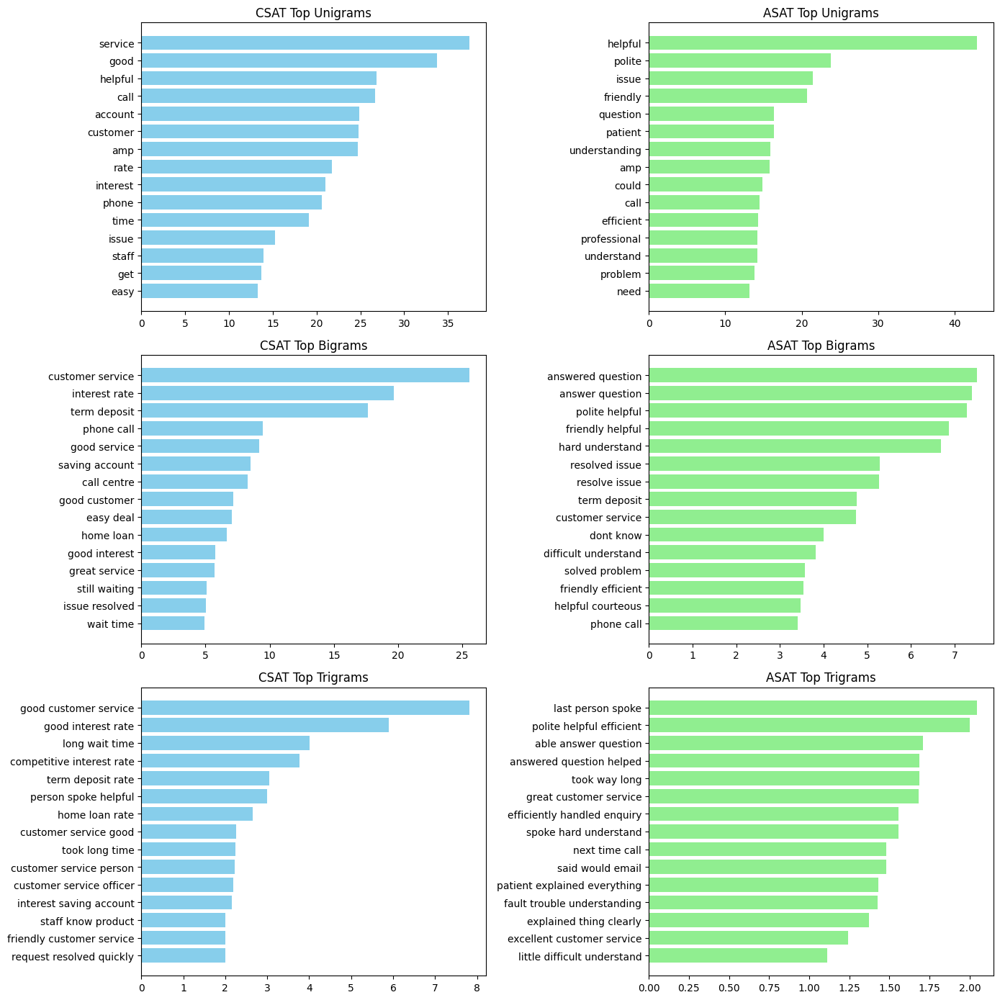

In [21]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt

# --- Feedback corpus ---
csat_texts = df['csat_clean'].dropna().tolist()
asat_texts = df['asat_clean'].dropna().tolist()

def get_top_tfidf(corpus, ngram_range=(1,1), top_n=15):
    """Return top n TF-IDF terms for a given corpus and n-gram range."""
    vectorizer = TfidfVectorizer(max_features=2000, ngram_range=ngram_range)
    X = vectorizer.fit_transform(corpus)
    words = vectorizer.get_feature_names_out()
    scores = X.sum(axis=0).A1
    df_terms = pd.DataFrame({'term': words, 'score': scores})
    return df_terms.sort_values(by='score', ascending=False).head(top_n)

# --- Top Unigrams ---
csat_uni = get_top_tfidf(csat_texts, (1,1))
asat_uni = get_top_tfidf(asat_texts, (1,1))

# --- Top Bigrams ---
csat_bi = get_top_tfidf(csat_texts, (2,2))
asat_bi = get_top_tfidf(asat_texts, (2,2))

# --- Top Trigrams ---
csat_tri = get_top_tfidf(csat_texts, (3,3))
asat_tri = get_top_tfidf(asat_texts, (3,3))

print("\n📌 CSAT Top Unigrams:\n", csat_uni)
print("\n📌 CSAT Top Bigrams:\n", csat_bi)
print("\n📌 CSAT Top Trigrams:\n", csat_tri)

print("\n📌 ASAT Top Unigrams:\n", asat_uni)
print("\n📌 ASAT Top Bigrams:\n", asat_bi)
print("\n📌 ASAT Top Trigrams:\n", asat_tri)

# --- Visualization ---
fig, axs = plt.subplots(3,2, figsize=(14,14))

# CSAT
axs[0,0].barh(csat_uni['term'][::-1], csat_uni['score'][::-1], color="skyblue")
axs[0,0].set_title("CSAT Top Unigrams")
axs[1,0].barh(csat_bi['term'][::-1], csat_bi['score'][::-1], color="skyblue")
axs[1,0].set_title("CSAT Top Bigrams")
axs[2,0].barh(csat_tri['term'][::-1], csat_tri['score'][::-1], color="skyblue")
axs[2,0].set_title("CSAT Top Trigrams")

# ASAT
axs[0,1].barh(asat_uni['term'][::-1], asat_uni['score'][::-1], color="lightgreen")
axs[0,1].set_title("ASAT Top Unigrams")
axs[1,1].barh(asat_bi['term'][::-1], asat_bi['score'][::-1], color="lightgreen")
axs[1,1].set_title("ASAT Top Bigrams")
axs[2,1].barh(asat_tri['term'][::-1], asat_tri['score'][::-1], color="lightgreen")
axs[2,1].set_title("ASAT Top Trigrams")

plt.tight_layout()
plt.show()


In [24]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

# --- Function: TF-IDF Clustering ---
def run_tfidf_clustering(texts, n_clusters=5, ngram_range=(1,2), top_n=10):
    """
    Run TF-IDF + KMeans clustering on feedback texts.
    Returns cluster labels and top terms per cluster.
    """
    vectorizer = TfidfVectorizer(ngram_range=ngram_range, max_features=2000)
    X = vectorizer.fit_transform(texts)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(X)

    terms = vectorizer.get_feature_names_out()
    cluster_terms = {}

    for i in range(n_clusters):
        mask = (labels == i)
        if mask.sum() == 0:
            continue
        cluster_matrix = X[mask].mean(axis=0)
        scores = cluster_matrix.A1
        top_terms = [terms[j] for j in scores.argsort()[-top_n:][::-1]]
        cluster_terms[i] = top_terms

    return labels, cluster_terms

# --- Run for CSAT ---
csat_texts = df['csat_clean'].dropna().tolist()
csat_labels, csat_clusters = run_tfidf_clustering(csat_texts, n_clusters=5, ngram_range=(1,2))

# Assign back to df
df.loc[df['csat_clean'].notna(), 'CSAT_theme_TFIDF'] = csat_labels

print("\n📌 CSAT TF-IDF Clusters:")
for c, terms in csat_clusters.items():
    print(f"Cluster {c}: {', '.join(terms)}")

# --- Run for ASAT ---
asat_texts = df['asat_clean'].dropna().tolist()
asat_labels, asat_clusters = run_tfidf_clustering(asat_texts, n_clusters=5, ngram_range=(1,2))

# Assign back to df
df.loc[df['asat_clean'].notna(), 'ASAT_theme_TFIDF'] = asat_labels

print("\n📌 ASAT TF-IDF Clusters:")
for c, terms in asat_clusters.items():
    print(f"Cluster {c}: {', '.join(terms)}")



📌 CSAT TF-IDF Clusters:
Cluster 0: speak someone, someone, speak, issue, someone phone, issue able, clarify, able speak, site, ability
Cluster 1: service, good, helpful, call, account, amp, customer, rate, interest, phone
Cluster 2: fully, answered, question, fill form, finalised, finally, finally got, finance, financial, financial institution
Cluster 3: still done, swift, multiple call, perform, swift transfer, amp wouldnt, house, call still, wouldnt, settlement
Cluster 4: know product, staff know, know, product, staff, prompt, apologetic, answer, knew, incorrect information

📌 ASAT TF-IDF Clusters:
Cluster 0: issue, amp, problem, polite, understand, call, could, understanding, patient, resolved
Cluster 1: friendly, good, friendly helpful, helpful, friendly efficient, efficient, knowledgeable, friendly polite, service, knowledgeable friendly
Cluster 2: professional, need, understanding, question, helpful professional, helpful, polite professional, training, polite, answered question


In [25]:
import pandas as pd

# --- Load your CSV ---
# df = pd.read_csv("new_onepager.csv")

# --- Check existing CSAT Theme categories ---
theme_counts = df['CSAT Theme'].value_counts(dropna=False)

print("📌 CSAT Theme Categories & Counts:\n")
print(theme_counts)

# --- Quick % distribution ---
theme_percent = (theme_counts / len(df)) * 100
print("\n📌 CSAT Theme Category % Distribution:\n")
print(theme_percent.round(2))


📌 CSAT Theme Categories & Counts:

CSAT Theme
0                              500
No CSAT Verbatim               208
Service - BCC                  155
Term Deposit process            43
Technology                      40
Generic                         33
Service - Lending               29
Service - general               22
Service - EDB                   14
Deposit rates                   11
Reputation                       8
Home lending rates               8
Product and Policy               7
Card management                  6
Home lending process             6
Payments and Transfers           5
Identification requirements      3
Deposit application process      3
Complaint process                2
Retention                        1
Unresolved                       1
Live chat                        1
Name: count, dtype: int64

📌 CSAT Theme Category % Distribution:

CSAT Theme
0                              45.21
No CSAT Verbatim               18.81
Service - BCC                  14

In [26]:
import pandas as pd

# --- Load your CSV ---
# df = pd.read_csv("new_onepager.csv")

# --- CSAT Theme ---
csat_counts = df['CSAT Theme'].value_counts(dropna=False)
csat_percent = (csat_counts / len(df)) * 100

print("📌 CSAT Theme Categories & Counts:\n")
print(csat_counts)
print("\n📌 CSAT Theme Category % Distribution:\n")
print(csat_percent.round(2))

# --- ASAT Theme ---
asat_counts = df['ASAT Theme'].value_counts(dropna=False)
asat_percent = (asat_counts / len(df)) * 100

print("\n📌 ASAT Theme Categories & Counts:\n")
print(asat_counts)
print("\n📌 ASAT Theme Category % Distribution:\n")
print(asat_percent.round(2))


📌 CSAT Theme Categories & Counts:

CSAT Theme
0                              500
No CSAT Verbatim               208
Service - BCC                  155
Term Deposit process            43
Technology                      40
Generic                         33
Service - Lending               29
Service - general               22
Service - EDB                   14
Deposit rates                   11
Reputation                       8
Home lending rates               8
Product and Policy               7
Card management                  6
Home lending process             6
Payments and Transfers           5
Identification requirements      3
Deposit application process      3
Complaint process                2
Retention                        1
Unresolved                       1
Live chat                        1
Name: count, dtype: int64

📌 CSAT Theme Category % Distribution:

CSAT Theme
0                              45.21
No CSAT Verbatim               18.81
Service - BCC                  14

In [23]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

# --- TF-IDF representation ---
vectorizer = TfidfVectorizer(ngram_range=(1,2), max_features=1000)
X = vectorizer.fit_transform(df['csat_clean'])

# --- Cluster into 5 themes ---
kmeans = KMeans(n_clusters=5, random_state=42)
df['CSAT_theme_TFIDF'] = kmeans.fit_predict(X)

# --- Look at top terms per cluster ---
terms = vectorizer.get_feature_names_out()
for i in range(5):
    mask = (df['CSAT_theme_TFIDF'] == i).to_numpy()  # convert Series → numpy array
    if mask.sum() == 0:
        continue
    cluster_matrix = X[mask].mean(axis=0)  # average TF-IDF vector for this cluster
    scores = cluster_matrix.A1              # flatten sparse to array
    top_terms = [terms[j] for j in scores.argsort()[-10:][::-1]]
    print(f"Cluster {i}: {top_terms}")


Cluster 0: ['speak someone', 'someone', 'able speak', 'speak', 'able', 'quickly efficiently', 'helped', 'efficiently', 'quickly', 'issue']
Cluster 1: ['service', 'good', 'call', 'helpful', 'account', 'amp', 'customer', 'phone', 'rate', 'interest']
Cluster 2: ['day ago', 'ago', 'day', 'anyone', 'heard', 'via email', 'requested', 'call', 'via', 'information']
Cluster 3: ['call still', 'house', 'wouldnt', 'settlement', 'call', 'multiple', 'done', 'phone call', 'transfer', 'back']
Cluster 4: ['withdrawn', 'saver account', 'rule', 'saver', 'disappointed', 'bonus interest', 'put', 'bonus', 'money', 'change']


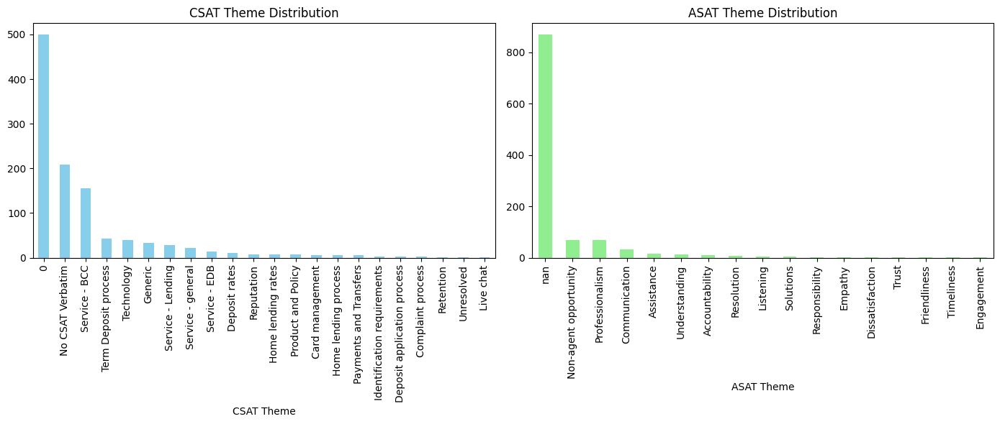

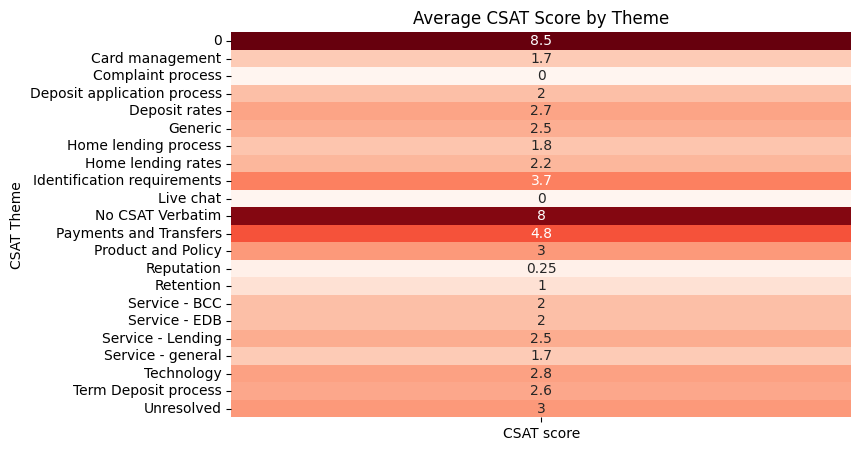

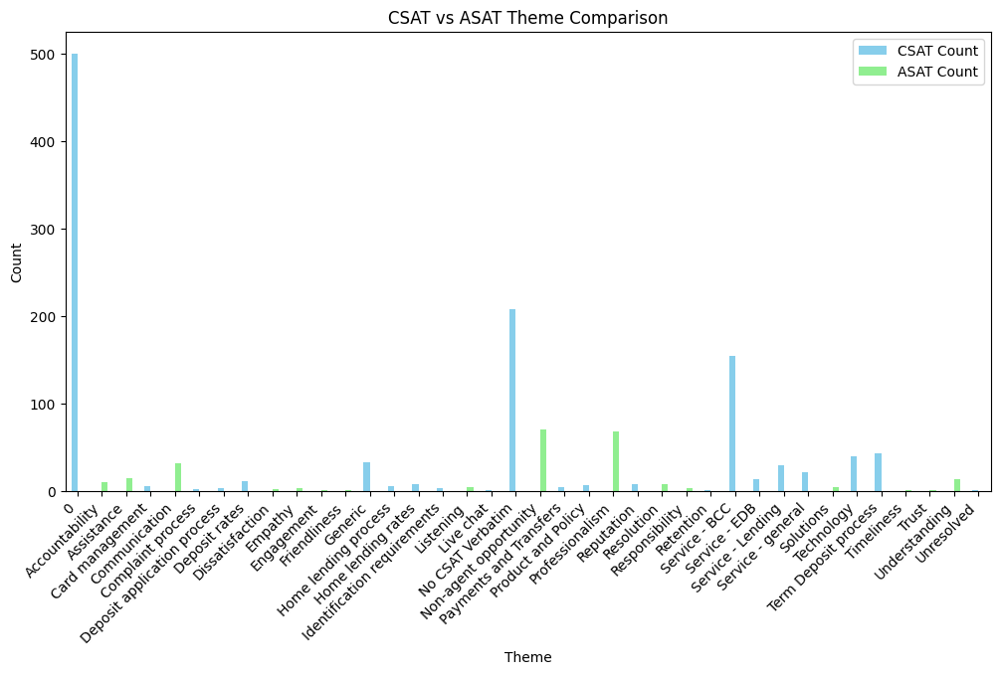

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# --- Load your data ---
# df = pd.read_csv("new_onepager.csv")

# ==========================================================
# 1. Theme Distribution (CSAT & ASAT)
# ==========================================================
csat_counts = df['CSAT Theme'].value_counts(dropna=False)
asat_counts = df['ASAT Theme'].value_counts(dropna=False)

fig, axs = plt.subplots(1,2, figsize=(14,6))
csat_counts.plot(kind="bar", ax=axs[0], color="skyblue", title="CSAT Theme Distribution")
asat_counts.plot(kind="bar", ax=axs[1], color="lightgreen", title="ASAT Theme Distribution")
plt.tight_layout()
plt.show()

# ==========================================================
# 2. Theme → Subcategory Drill-down (Treemap)
# ==========================================================
if "Subcategory" in df.columns:
    theme_subcat = df.groupby(['CSAT Theme','Subcategory']).size().reset_index(name='count')
    fig = px.treemap(theme_subcat, path=['CSAT Theme','Subcategory'], values='count',
                     color='count', color_continuous_scale='Blues',
                     title="CSAT Themes → Subcategories")
    fig.show()

# ==========================================================
# 3. Average CSAT Score by Theme (Heatmap)
# ==========================================================
if 'CSAT score' in df.columns:
    csat_avg = df.groupby('CSAT Theme')['CSAT score'].mean().reset_index()
    plt.figure(figsize=(8,5))
    sns.heatmap(csat_avg.pivot_table(values='CSAT score', index='CSAT Theme'),
                annot=True, cmap="Reds", cbar=False)
    plt.title("Average CSAT Score by Theme")
    plt.show()

# ==========================================================
# 4. Weekly Trend by Theme
# ==========================================================
if 'completed date2' in df.columns:   # assuming you have this timestamp column
    df['completed date2'] = pd.to_datetime(df['completed date2'], errors='coerce')
    df['Week'] = df['completed date2'].dt.to_period('W').apply(lambda r: r.start_time)

    weekly_trend = df.groupby(['Week','CSAT Theme']).size().reset_index(name='count')

    plt.figure(figsize=(12,6))
    sns.lineplot(data=weekly_trend, x='Week', y='count', hue='CSAT Theme', marker="o")
    plt.title("Weekly Trend of CSAT Themes")
    plt.xticks(rotation=45)
    plt.show()

# ==========================================================
# 5. CSAT vs ASAT Theme Comparison
# ==========================================================
csat_theme_summary = df['CSAT Theme'].value_counts().rename_axis('Theme').reset_index(name='CSAT Count')
asat_theme_summary = df['ASAT Theme'].value_counts().rename_axis('Theme').reset_index(name='ASAT Count')

comparison = pd.merge(csat_theme_summary, asat_theme_summary, on="Theme", how="outer").fillna(0)

comparison.plot(x="Theme", kind="bar", figsize=(12,6), color=["skyblue","lightgreen"])
plt.title("CSAT vs ASAT Theme Comparison")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.show()

# ==========================================================
# 6. Top Subcategories Pareto
# ==========================================================
if "Subcategory" in df.columns:
    subcat_counts = df['Subcategory'].value_counts().head(15)
    plt.figure(figsize=(12,6))
    sns.barplot(x=subcat_counts.index, y=subcat_counts.values, palette="Blues_d")
    plt.title("Top 15 Subcategories (Pareto)")
    plt.ylabel("Count")
    plt.xticks(rotation=45, ha="right")
    plt.show()


In [9]:
# =====================================================
# 📌 Block 1: Setup & Data Load
# =====================================================
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('wordnet')

# Load data
#df = pd.read_csv("new_onepager.csv", low_memory=False)

# Convert dates
df['Completed Date 2'] = pd.to_datetime(df['Completed Date 2'], errors='coerce')

# Fix FCR
df['FCR'] = df['FCR'].astype(str).str.strip().str.lower()
df['FCR'] = df['FCR'].replace({'yes':1,'no':0,'fcr yes':1,'fcr no':0,'1':1,'0':0})
df['FCR'] = pd.to_numeric(df['FCR'], errors='coerce').fillna(0)

# Rename key columns
df = df.rename(columns={
    'How would you rate the service you received from the consultant handling your enquiry?': 'ASAT score',
    'What are your most important reasons for giving us that score?': 'csat_feedback',
    'ID': 'agentid'
})
df['ASAT_feedback'] = (
    df['We’d love to know what the consultant did to earn such a rating?'].fillna('') + " " +
    df['How could the consultant improve how they handled your enquiry?'].fillna('')
).str.strip()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [10]:
# =====================================================
# 📌 Block 2: Text Preprocessing
# =====================================================
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    if pd.isna(text):
        return ""
    text = text.lower()
    text = re.sub(r'[^a-z\s]', '', text)
    tokens = [lemmatizer.lemmatize(w) for w in text.split() if w not in stop_words]
    return " ".join(tokens)

df['csat_clean'] = df['csat_feedback'].astype(str).apply(preprocess_text)
df['asat_clean'] = df['ASAT_feedback'].astype(str).apply(preprocess_text)


In [11]:
# =====================================================
# 📌 Block 3: Topic Modeling with BERTopic
# =====================================================
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# CSAT themes
csat_feedback = df['csat_clean'].dropna()
topic_model_csat = BERTopic(embedding_model=embedding_model, top_n_words=7, nr_topics="auto")
topics_csat, _ = topic_model_csat.fit_transform(csat_feedback)

df.loc[df['csat_clean'].notna(), 'CSAT_theme'] = [
    " ".join([w for w,_ in topic_model_csat.get_topic(t)]) if t != -1 else "Other"
    for t in topics_csat
]

# ASAT themes
asat_feedback = df['asat_clean'].dropna()
topic_model_asat = BERTopic(embedding_model=embedding_model, top_n_words=7, nr_topics="auto")
topics_asat, _ = topic_model_asat.fit_transform(asat_feedback)

df.loc[df['asat_clean'].notna(), 'ASAT_theme'] = [
    " ".join([w for w,_ in topic_model_asat.get_topic(t)]) if t != -1 else "Other"
    for t in topics_asat
]

print("\n📌 Number of CSAT themes:", len(topic_model_csat.get_topics()))
print("\n📌 Number of ASAT themes:", len(topic_model_asat.get_topics()))



📌 Number of CSAT themes: 3

📌 Number of ASAT themes: 4



📌 Top 5 CSAT Themes:
CSAT_theme
nan                                             8.009615
account call amp service time phone customer    5.736080
Name: CSAT score, dtype: float64

📌 Top 5 ASAT Themes:
ASAT_theme
know dont                                       8.736842
good excellent carl awesome amazing bad best    8.000000
na low upset sure could                         7.491803
helpful amp issue call question polite could    7.361011
Name: ASAT score, dtype: float64


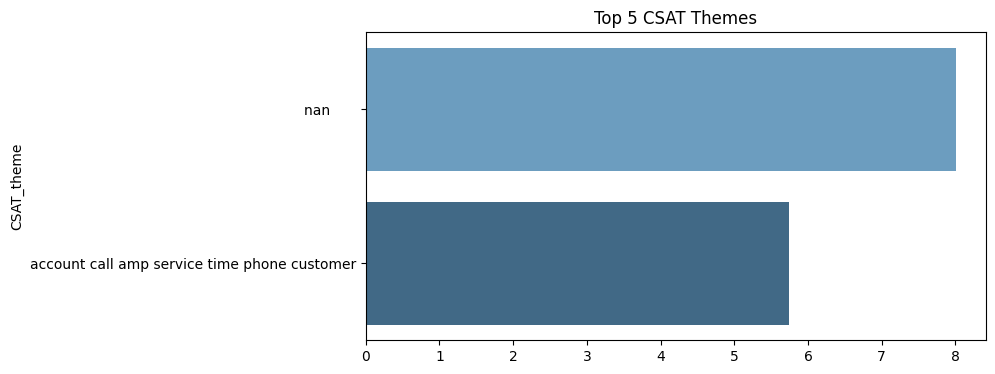

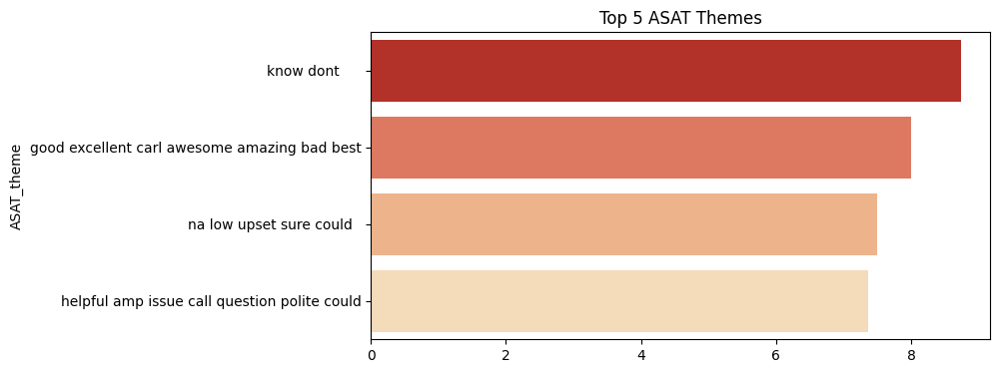

In [12]:
# =====================================================
# 📌 Block 4: Top Themes (CSAT & ASAT)
# =====================================================
csat_theme_scores = df.groupby('CSAT_theme')['CSAT score'].mean().sort_values(ascending=False)
asat_theme_scores = df.groupby('ASAT_theme')['ASAT score'].mean().sort_values(ascending=False)

print("\n📌 Top 5 CSAT Themes:")
print(csat_theme_scores.head(5))

print("\n📌 Top 5 ASAT Themes:")
print(asat_theme_scores.head(5))

plt.figure(figsize=(8,4))
sns.barplot(x=csat_theme_scores.head(5).values, y=csat_theme_scores.head(5).index, palette="Blues_d")
plt.title("Top 5 CSAT Themes")
plt.show()

plt.figure(figsize=(8,4))
sns.barplot(x=asat_theme_scores.head(5).values, y=asat_theme_scores.head(5).index, palette="OrRd_r")
plt.title("Top 5 ASAT Themes")
plt.show()
